# **Day 6 - Galaxy Observation**

# ***Importing libraries -> Some Maths -> Vizualization***

# ***Note: Warning: Kindly consider: Our approach will be as a data scientist and not as an astronomer***



# NGC 6946, sometimes referred to as the Fireworks Galaxy, is an intermediate spiral galaxy with a small bright nucleus, 

# whose location in the sky straddles the boundary between the northern constellations of Cepheus and Cygnus 

#Its distance from Earth is about 25.2 million light-years

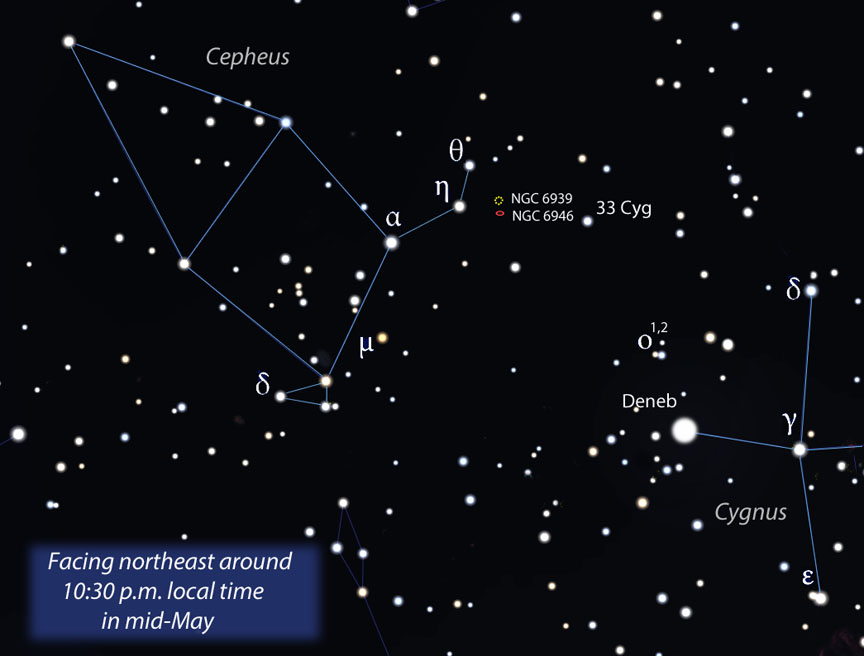

## App : Skyview Lite

### about one-third of the Milky Way's size
# it contains roughly half the number of stars as the Milky Way
# It is heavily obscured by interstellar matter due to its location close to the galactic plane of the Milky Way. 
# Due to its prodigious star formation it has been classified as an active starburst galaxy.

# Various unusual celestial objects have been observed within NGC 6946
# This includes the so-called 'Red Ellipse' along one of the northern arms that looks like a super-bubble or very large supernova remnant, and which may have been formed by an open cluster containing massive stars
# There are also two regions of unusual dark lanes of nebulosity, while within the spiral arms several regions appear devoid of stars and gaseous hydrogen


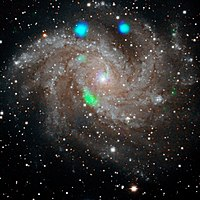

# It is a  Starburst galaxy

# **2 reasons why this galaxy ?**
**Why is it called fireworks ?**
**What should be first step ?**

# **Datatype**

*   Flexible Image Transport System (FITS) is an open standard defining a digital file format useful for storage, transmission and processing of data: formatted as multi-dimensional arrays (for example a 2D image), or tables.
*   The FITS standard was designed specifically for astronomical data, and includes provisions such as describing photometric and spatial calibration information, together with image origin metadata.
*   Image metadata is stored in a human-readable ASCII header.
*   Each FITS file consists of one or more headers containing ASCII card image that carry keyword/value pairs, interleaved between data blocks
*   The keyword/value pairs provide information such as size, origin, coordinates, binary data format, free-form comments, history of the data, and anything else the creator desires: while many keywords are reserved for FITS use, the standard allows arbitrary use of the rest of the name-space.
*   A FITS file may contain several extensions, and each of these may contain a data object. For example, it is possible to store x-ray and infrared exposures in the same file.






# ***Let's start***

# *STEP 1: Install libraries*

In [ ]:
!pip install astropy
!pip install specutils

     |████████████████████████████████| 190 kB 5.7 MB/s 
     |████████████████████████████████| 448 kB 43.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 104 kB 62.5 MB/s 
     |████████████████████████████████| 108 kB 42.3 MB/s 
     |████████████████████████████████| 68 kB 6.7 MB/s 
     |████████████████████████████████| 56 kB 4.4 MB/s 
     |████████████████████████████████| 191 kB 66.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 48 kB 5.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for asdf: filename=asdf

# *STEP 2: Bring data*

In [ ]:
from google.colab import drive

In [ ]:


drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:

!unzip /content/gdrive/MyDrive/GALAXIES_CENTER.zip

Archive:  /content/gdrive/MyDrive/GALAXIES_CENTER.zip
  inflating: M100/ISO/csli23500615.fits  
  inflating: M100/NEAR_INFRARED/idkv31030_drz.fits  
  inflating: M100/OPTICAL/hst_05195_01_wfpc2_f702w_pc_drz.fits  
  inflating: M100/XMM_Newton_Soft_Xray/P0106860201EPX0003COLIM8000.FTZ  
  inflating: M100/XMM_OM_Optical/P0106860201OMX000USIMAGU000.FTZ  
  inflating: M101/ISO/csli26902583.fits  
  inflating: M101/NEAR_INFRARED/hst_11080_a6_nic_nic3_f187n_drz.fits  
  inflating: M101/OPTICAL/hst_13361_03_wfc3_uvis_f502n_drz.fits  
  inflating: M101/XMM_Newton_Soft_Xray/P0164560701EPX0003COLIM8000.FTZ  
  inflating: M101/XMM_OM_Optical/P0212480201OMX000USIMAGU000.FTZ  
  inflating: M31/ISO/csp4000162201.fits  
  inflating: M31/NEAR_INFRARED/hst_7919_13_nic_nic3_f160w_drz.fits  
  inflating: M31/OPTICAL/hst_05464_02_wfpc2_f814w_pc_drz.fits  
  inflating: M31/XMM_NEWTON_Soft_Xray/P0112570401EPX0003COLIM8000.FTZ  
  inflating: M31/XMM_OM_Optical/P0112570601OMX000USIMAGB000.FTZ  
  inflating: M

# STEP 3: Import general libraries

In [ ]:
#GENERAL

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as mtpltcm
from mpl_toolkits.mplot3d import Axes3D
import random
import time

# STEP 4: Import astronomical library and functions

In [ ]:
from astropy.visualization import astropy_mpl_style
from astropy.utils.data import get_pkg_data_filename
from astropy.io import fits
import astropy
from astropy import units as u 
import astropy.wcs as fitswcs
from astropy.cosmology import WMAP9 as Cosmology

# STEP 5: Import Image Processing libraries and functions

In [ ]:
#IMAGE PROCESS

from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras.preprocessing import image
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from scipy.ndimage.filters import convolve
from skimage import data, io, filters
import skimage.morphology as morph
import skimage.exposure as skie
import skimage
from skimage.morphology import convex_hull_image, erosion
from IPython import display
from scipy.ndimage import gaussian_filter
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.patches as patches

# STEP 6: Import functions to scale and transform data

**What do we mean by Scale and Transform**

In [ ]:
#SCALER & TRANSFORMATION

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder
import sklearn

# STEP 7: Few more libraries

In [ ]:

from scipy.io.wavfile import read, write
import librosa
import librosa.display
import IPython
from IPython.display import Audio
import scipy
from scipy import signal
from scipy.fft import fftshift

# STEP 8:  Ignore warnings

In [ ]:
#IGNORING WARNINGS

from warnings import filterwarnings

filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)
filterwarnings("ignore", category=RuntimeWarning)

# Enough: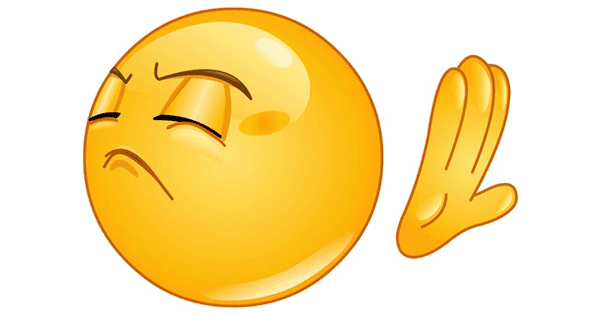

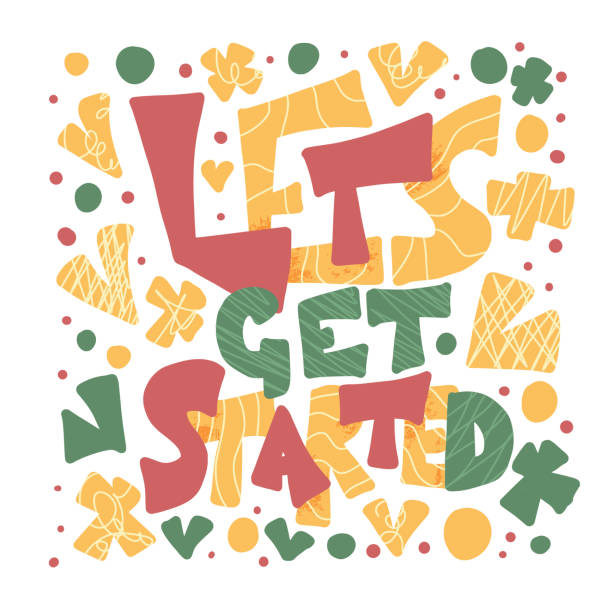

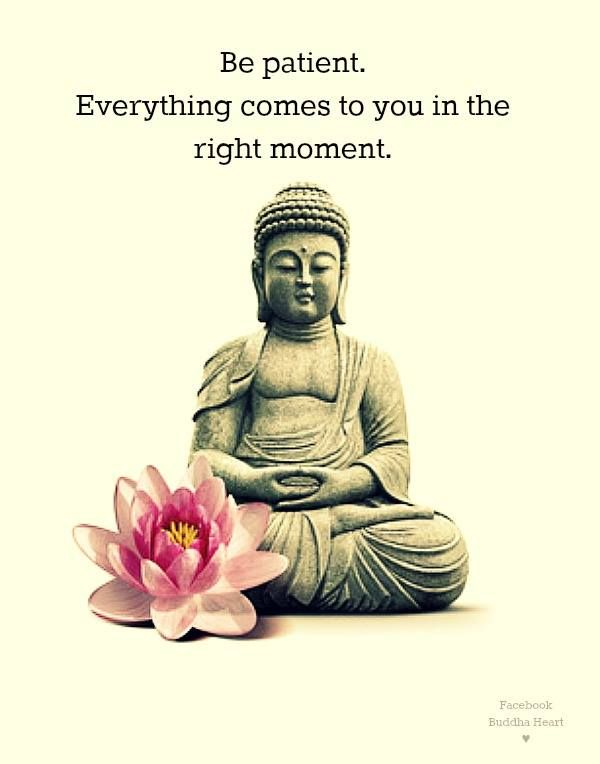

# STEP 9: Initializing variables

In [ ]:
ONE_LIGHT_YEAR_TO_KM = (9.46 * 10 ** 12)

print("ONE LIGHT YEAR AS KM:",ONE_LIGHT_YEAR_TO_KM)

ONE LIGHT YEAR AS KM: 9460000000000.0


In [ ]:
HUBBLE_CONSTANT_Z_0 = Cosmology.H(0)

print("HUBBLE CONSTANT: ", HUBBLE_CONSTANT_Z_0.value,HUBBLE_CONSTANT_Z_0.unit)

HUBBLE CONSTANT:  69.32 km / (Mpc s)


# Megaparsec (MPC) 
Equals one million parsecs (3.26 million light-year s) and is the unit of distance commonly used to measure the distance between galaxies.

In [ ]:
NGC_6946_MPC = 1000
NGC_6946_KPC_DISTANCE = NGC_6946_MPC * 1000 # 1 KPC

In [ ]:
print("NGC 6946 KPC DISTANCE: ", NGC_6946_KPC_DISTANCE, "KILOPARSEC")

NGC 6946 KPC DISTANCE:  1000000 KILOPARSEC


# Redshift

Relative increase in wavelength of electromagnetic radiation in the emission spectrum of astronomical objects


http://www.vivaxsolutions.com/images/Redshift.gif

In [ ]:
NGC_6946_REDSHIFT = 0.000133

print("REDSHIFT OF NGC6946: ", NGC_6946_REDSHIFT)

REDSHIFT OF NGC6946:  0.000133


# DISTANCE_AS_LIGHT_YEAR

In [ ]:

NGC_6946_DISTANCE_AS_LIGHT_YEAR = 25.2 * (10 ** 6)

print("NGC 6946 DISTANCE AS LIGHT YEAR: ", NGC_6946_DISTANCE_AS_LIGHT_YEAR, "LIGHT YEAR")

NGC 6946 DISTANCE AS LIGHT YEAR:  25200000.0 LIGHT YEAR


# DISTANCE_AS_KM

In [ ]:

NGC_6946_DISTANCE_AS_KM = NGC_6946_DISTANCE_AS_LIGHT_YEAR * ONE_LIGHT_YEAR_TO_KM

print("NGC 6946 DISTANCE AS KM: ", "%.f" % NGC_6946_DISTANCE_AS_KM, "KM")

NGC 6946 DISTANCE AS KM:  238392000000000000000 KM


# search NGC 6946

https://en.wikipedia.org/wiki/NGC_6946

In [ ]:
NGC_6946_MPC = 7.72

print("NGC 6946 DISTANCE MPC: ",NGC_6946_MPC, "MEGAPARSEC")
NGC_6946_MPC_TO_LY = NGC_6946_MPC * (3.26 * 10 ** 6) # 1 MPC - 3.26 MILLION LIGHT YEARS

print("NGC 6946 DISTANCE MPC TO LY: ", "%.f" % NGC_6946_MPC_TO_LY, "LIGHT YEAR")
NGC_6946_MPC_TO_PC = NGC_6946_MPC * (10 ** 6) # 1 MPC - 1 MILLION PARSEC

print("NGC 6946 DISTANCE MPC TO PC: ", int(NGC_6946_MPC_TO_PC), "PARSEC")
NGC_6946_KM_TO_AU = NGC_6946_DISTANCE_AS_KM / (1.5 * 10 ** 8) # 1 AU - 1.5 * (10 ** 8) KM

print("NGC 6946 DISTANCE KM TO AU: ", "%.f" % NGC_6946_KM_TO_AU, "AU")
NGC_6946_KPC_DISTANCE = NGC_6946_MPC * 1000 # 1 MPC = 1000 KPC

print("NGC 6946 KPC DISTANCE: ", NGC_6946_KPC_DISTANCE, "KILOPARSEC")

NGC 6946 DISTANCE MPC:  7.72 MEGAPARSEC
NGC 6946 DISTANCE MPC TO LY:  25167200 LIGHT YEAR
NGC 6946 DISTANCE MPC TO PC:  7720000 PARSEC
NGC 6946 DISTANCE KM TO AU:  1589280000000 AU
NGC 6946 KPC DISTANCE:  7720.0 KILOPARSEC


# STEP 10: Deriving few parameters

# HUBBLE LAW FOR NGC 6946 REDSHIFT

The velocity of the galaxy which is also known as the redshift is directly proportional to its distance.

In [ ]:
print("HUBBLE LAW FOR NGC 6946 REDSHIFT: ", Cosmology.H(NGC_6946_REDSHIFT))

HUBBLE LAW FOR NGC 6946 REDSHIFT:  69.3239641227999 km / (Mpc s)


# Recessional velocity 

It is the rate at which an extragalactic astronomical object recedes (becomes more distant) from an observer as a result of the expansion of the universe.It can be measured by observing the wavelength shifts of spectral lines emitted by the object, known as the object's cosmological redshift.

https://en.wikipedia.org/wiki/Recessional_velocity

In [ ]:
print("NGC 6946 RECESSIONAL VELOCITY BASED ON LIGHT YEAR: ", HUBBLE_CONSTANT_Z_0.value * NGC_6946_DISTANCE_AS_LIGHT_YEAR)

NGC 6946 RECESSIONAL VELOCITY BASED ON LIGHT YEAR:  1746863999.9999998


In [ ]:
print("NGC 6946 RECESSIONAL VELOCITY BASED ON MPC: ", HUBBLE_CONSTANT_Z_0.value * NGC_6946_MPC)
print("BASED ON KPC DISTANCE: ",Cosmology.arcsec_per_kpc_proper(NGC_6946_KPC_DISTANCE))

NGC 6946 RECESSIONAL VELOCITY BASED ON MPC:  535.1503999999999
BASED ON KPC DISTANCE:  111.91405944932866 arcsec / kpc


# STEP 11: Calculation of distance, volume, brightness, luminocity

In [ ]:
print("BASED ON REDSHIFT: ",Cosmology.comoving_distance(NGC_6946_REDSHIFT))
print("MPC TO LY: ",Cosmology.comoving_distance(NGC_6946_REDSHIFT).value * (3.26 * 10 ** 6))
print("BASED ON REDSHIFT: ",Cosmology.comoving_volume(NGC_6946_REDSHIFT))
print("BASED ON REDSHIFT: ",Cosmology.luminosity_distance(NGC_6946_REDSHIFT))
APPARENT_BRIGHTNESS_NGC_6946_BASED_ON_MPC = 1 / (NGC_6946_MPC ** 2)
APPARENT_BRIGHTNESS_NGC_6946_BASED_ON_LY = 1 / (NGC_6946_DISTANCE_AS_LIGHT_YEAR ** 2)

print("APPARENT BRIGHTNESS BASED ON MPC: ", "%.20f" % APPARENT_BRIGHTNESS_NGC_6946_BASED_ON_MPC," MEGAPARSEC")
print("APPARENT BRIGHTNESS BASED ON LY: ", "%.20f" % APPARENT_BRIGHTNESS_NGC_6946_BASED_ON_LY," LIGHT YEAR")
LUMINOSITY_NGC_6946_BASED_ON_LY = 4 * (3.14159265359) * (NGC_6946_DISTANCE_AS_LIGHT_YEAR ** 2) * APPARENT_BRIGHTNESS_NGC_6946_BASED_ON_LY
LUMINOSITY_NGC_6946_BASED_ON_MPC = 4 * (3.14159265359) * (NGC_6946_MPC ** 2) * APPARENT_BRIGHTNESS_NGC_6946_BASED_ON_MPC

print("LUMINOSITY BASED ON LY: ", "%.20f" % LUMINOSITY_NGC_6946_BASED_ON_LY)
print("LUMINOSITY BASED ON MPC: ", "%.20f" % LUMINOSITY_NGC_6946_BASED_ON_MPC)
PARSEC_NGC_6946_LY_TO_PC = NGC_6946_DISTANCE_AS_LIGHT_YEAR * 0.31 # 1 LIGHT YEAR = 0.31 PC

print("NGC 6946 PARSEC: ", PARSEC_NGC_6946_LY_TO_PC, " PC")

BASED ON REDSHIFT:  0.5751768166298624 Mpc
MPC TO LY:  1875076.4222133516
BASED ON REDSHIFT:  0.7970631437693235 Mpc3
BASED ON REDSHIFT:  0.5752533151464742 Mpc
APPARENT BRIGHTNESS BASED ON MPC:  0.01677897393218609826  MEGAPARSEC
APPARENT BRIGHTNESS BASED ON LY:  0.00000000000000157470  LIGHT YEAR
LUMINOSITY BASED ON LY:  12.56637061436000024628
LUMINOSITY BASED ON MPC:  12.56637061436000024628
NGC 6946 PARSEC:  7812000.0  PC


# So far it was maths, Lets go to Images

# STEP 12: Reading Image data

In [43]:
NEAR_INFRARED_PATH = "/content/NGC6946/NEAR_INFRARED/n4k48nbsq_cal.fits"
HST_OPTICAL_PATH = "/content/NGC6946/OPTICAL/HST/idk404050/idk404050_drc.fits"
XMM_NEWTON_PATH = "/content/NGC6946/XMM_NEWTON_Soft_Xray/P0200670301EPX0003COLIM8000.FTZ"
XMM_OM_PATH = "/content/NGC6946/XMM_OM_Optical/P0200670301OMX000LSIMAGB000.FTZ"
ISO_PATH = "/content/NGC6946/ISO/csp3390040401.fits"

In [44]:
ISO_PATH

'/content/NGC6946/ISO/csp3390040401.fits'

# STEP 13: EDA Exploratory data analysis

In [ ]:
NI_OPEN = fits.open(NEAR_INFRARED_PATH)
HST_OPEN = fits.open(HST_OPTICAL_PATH)
XMM_NEWTON_OPEN = fits.open(XMM_NEWTON_PATH)
XMM_OM_OPEN = fits.open(XMM_OM_PATH)
ISO_OPEN = fits.open(ISO_PATH)
OPEN_LIST = [NI_OPEN,HST_OPEN,XMM_NEWTON_OPEN,XMM_OM_OPEN,ISO_OPEN]
OPEN_NAME_LIST = ["NEAR_INFRARED","HST","NEWTON","OM","ISO"]
for x_open,x_name in zip(OPEN_LIST,OPEN_NAME_LIST):
    print(x_name)
    print("---"*10)
    print(x_open.info())
    print("\n")

NEAR_INFRARED
------------------------------
Filename: /content/NGC6946/NEAR_INFRARED/n4k48nbsq_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     309   ()      
  1  SCI           1 ImageHDU       143   (256, 256)   float32   
  2  ERR           1 ImageHDU        71   (256, 256)   float32   
  3  DQ            1 ImageHDU        71   (256, 256)   int16   
  4  SAMP          1 ImageHDU        71   (256, 256)   int16   
  5  TIME          1 ImageHDU        71   (256, 256)   float32   
None


HST
------------------------------
Filename: /content/NGC6946/OPTICAL/HST/idk404050/idk404050_drc.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     890   ()      
  1  SCI           1 ImageHDU        96   (4130, 4465)   float32   
  2  WHT           1 ImageHDU        45   (4130, 4465)   float32   
  3  CTX           1 ImageHDU        40   (4130, 4465)   int32   
  4  HDRTAB        1 BinTableHD

In [45]:
NI_PRIMARY_OPERATION = NI_OPEN[0].header

In [46]:
NI_PRIMARY_OPERATION


SIMPLE  =                    T / Fits standard                                  
BITPIX  =                   16 / Bits per pixel                                 
NAXIS   =                    0 / Number of axes                                 
EXTEND  =                    T / File may contain extensions                    
ORIGIN  = 'NOAO-IRAF FITS Image Kernel July 2003' / FITS file originator        
IRAF-TLM= '12:08:58 (13/06/2009)' / Time of last modification                   
NEXTEND =                    5 / Number of standard extensions                  
DATE    = '2009-06-13T12:08:58' / date this file was written (yyyy-mm-dd)       
FILENAME= 'n4k48nbsq_cal.fits' / name of file                                   
FILETYPE= 'SCI      '          / type of data found in data file                
                                                                                
TELESCOP= 'HST'                / telescope used to acquire data                 
INSTRUME= 'NICMOS'          

In [ ]:
NI_PRIMARY_OPERATION = NI_OPEN[0].header
NI_SCI_OPERATION = NI_OPEN[1].header

HST_PRIMARY_OPERATION = HST_OPEN[0].header
HST_SCI_OPERATION = HST_OPEN[1].header
NI_PRIMARY_OPERATION
NI_SCI_OPERATION
HST_PRIMARY_OPERATION
HST_SCI_OPERATION

XTENSION= 'IMAGE   '           / Image extension                                
BITPIX  =                  -32 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 4130                                                  
NAXIS2  =                 4465                                                  
PCOUNT  =                    0 / number of parameters                           
GCOUNT  =                    1 / number of groups                               
INHERIT =                    T / inherit the primary header                     
EXTNAME = 'SCI     '           / extension name                                 
EXTVER  =                    1 / extension version number                       
ROOTNAME= 'idk404zaq                         ' / rootname of the observation set
EXPNAME = 'idk404zaq                ' / exposure identifier                     
BUNIT   = 'ELECTRONS/S'     

In [ ]:
print(NI_PRIMARY_OPERATION.comments["TARGNAME"] + " ",NI_PRIMARY_OPERATION["TARGNAME"])

print(NI_PRIMARY_OPERATION.comments["RA_TARG"] + " ",NI_PRIMARY_OPERATION["RA_TARG"])
print(NI_PRIMARY_OPERATION.comments["DEC_TARG"] + " ",NI_PRIMARY_OPERATION["DEC_TARG"])

print(NI_PRIMARY_OPERATION.comments["GAL_LAT"] + " ",NI_PRIMARY_OPERATION["GAL_LAT"])
print(NI_PRIMARY_OPERATION.comments["GAL_LONG"] + " ",NI_PRIMARY_OPERATION["GAL_LONG"])

print(NI_PRIMARY_OPERATION.comments["ECL_LAT"] + " ",NI_PRIMARY_OPERATION["ECL_LAT"])
print(NI_PRIMARY_OPERATION.comments["ECL_LONG"] + " ",NI_PRIMARY_OPERATION["ECL_LONG"])
print(NI_PRIMARY_OPERATION.comments["SUNANGLE"] + " ",NI_PRIMARY_OPERATION["SUNANGLE"])
print(NI_PRIMARY_OPERATION.comments["MOONANGL"] + " ",NI_PRIMARY_OPERATION["MOONANGL"])

print(NI_PRIMARY_OPERATION.comments["DATE-OBS"] + " ",NI_PRIMARY_OPERATION["DATE-OBS"])
print(NI_PRIMARY_OPERATION.comments["TIME-OBS"] + " ",NI_PRIMARY_OPERATION["TIME-OBS"])

print(NI_PRIMARY_OPERATION.comments["EXPSTART"] + " ",NI_PRIMARY_OPERATION["EXPSTART"])
print(NI_PRIMARY_OPERATION.comments["EXPEND"] + " ",NI_PRIMARY_OPERATION["EXPEND"])
print(NI_PRIMARY_OPERATION.comments["EXPTIME"] + " ",NI_PRIMARY_OPERATION["EXPTIME"])
print(NI_PRIMARY_OPERATION.comments["PATTERN1"] + " ",NI_PRIMARY_OPERATION["PATTERN1"])
print(NI_PRIMARY_OPERATION.comments["P1_SHAPE"] + " ",NI_PRIMARY_OPERATION["P1_SHAPE"])
print(NI_PRIMARY_OPERATION.comments["P1_PURPS"] + " ",NI_PRIMARY_OPERATION["P1_PURPS"])
print(NI_PRIMARY_OPERATION.comments["P1_NPTS"] + " ","%.30f" % NI_PRIMARY_OPERATION["P1_NPTS"])
print(NI_PRIMARY_OPERATION.comments["P1_PSPAC"] + " ","%.30f" % NI_PRIMARY_OPERATION["P1_PSPAC"])
print(NI_PRIMARY_OPERATION.comments["P1_LSPAC"] + " ","%.30f" % NI_PRIMARY_OPERATION["P1_LSPAC"])
print(NI_SCI_OPERATION.comments["CRVAL1"] + " ","%.10f" % NI_SCI_OPERATION["CRVAL1"])
print(NI_SCI_OPERATION.comments["CRVAL2"] + " ","%.10f" % NI_SCI_OPERATION["CRVAL2"])
print(NI_SCI_OPERATION.comments["CRPIX1"] + " ","%.10f" % NI_SCI_OPERATION["CRPIX1"])
print(NI_SCI_OPERATION.comments["CRPIX2"] + " ","%.10f" % NI_SCI_OPERATION["CRPIX2"])
print(NI_SCI_OPERATION.comments["CD1_1"] + " ","%.20f" % NI_SCI_OPERATION["CD1_1"])
print(NI_SCI_OPERATION.comments["CD1_2"] + " ","%.20f" % NI_SCI_OPERATION["CD1_2"])
print(NI_SCI_OPERATION.comments["CD2_1"] + " ","%.20f" % NI_SCI_OPERATION["CD2_1"])
print(NI_SCI_OPERATION.comments["CD2_2"] + " ","%.20f" % NI_SCI_OPERATION["CD2_2"])
print(NI_SCI_OPERATION.comments["DATAMIN"] + " ","%.10f" % NI_SCI_OPERATION["DATAMIN"])
print(NI_SCI_OPERATION.comments["DATAMAX"] + " ","%.10f" % NI_SCI_OPERATION["DATAMAX"])
print(NI_PRIMARY_OPERATION.comments["PHOTFLAM"] + " ","%.30f" % NI_PRIMARY_OPERATION["PHOTFLAM"])
print(NI_PRIMARY_OPERATION.comments["PHOTMODE"] + " ",NI_PRIMARY_OPERATION["PHOTMODE"])
print(NI_PRIMARY_OPERATION.comments["PHOTFNU"] + " ","%.10f" % NI_PRIMARY_OPERATION["PHOTFNU"])
print(NI_PRIMARY_OPERATION.comments["PHOTZPT"] + " ","%.10f" % NI_PRIMARY_OPERATION["PHOTZPT"])
print(NI_PRIMARY_OPERATION.comments["PHOTPLAM"] + " ","%.10f" % NI_PRIMARY_OPERATION["PHOTPLAM"])
print(NI_PRIMARY_OPERATION.comments["PHOTBW"] + " ","%.10f" % NI_PRIMARY_OPERATION["PHOTBW"])
print(NI_PRIMARY_OPERATION.comments["ZPSCALE"] + " ","%.10f" % NI_PRIMARY_OPERATION["ZPSCALE"])
print(NI_PRIMARY_OPERATION.comments["PHOTFERR"] + " ","%.10f" % NI_PRIMARY_OPERATION["PHOTFERR"])

proposer's target name  NGC6946
right ascension of the target (deg) (J2000)  308.7129269091
declination of the target (deg) (J2000)  60.15688426073
galactic latitude of the target (deg) (J2000)  11.676674
galactic longitude of the target (deg) (J2000)  95.719937
ecliptic latitude of the target (deg) (J2000)  71.854725
ecliptic longitude of the target (deg) (J2000)  357.934704
angle between sun and V1 axis  80.86013
angle between moon and V1 axis  105.106544
UT date of start of observation (yyyy-mm-dd)  1998-01-19
UT time of start of observation (hh:mm:ss)  02:42:33
exposure start time (Modified Julian Date)  50832.11288897
exposure end time (Modified Julian Date)  50832.1151112
exposure duration (seconds)--calculated  191.9587
primary pattern type  NONE
primary pattern shape  LINE
primary pattern purpose  MOSAIC
number of points in primary pattern  0.000000000000000000000000000000
point spacing for primary pattern (arc-sec)  0.000000000000000000000000000000
line spacing for primary pat

In [ ]:
NI_SCI = NI_OPEN[1].data
NI_ERR = NI_OPEN[2].data
NI_DQ = NI_OPEN[3].data
NI_SAMP = NI_OPEN[4].data
NI_TIME = NI_OPEN[5].data
HST_SCI = HST_OPEN[1].data
HST_WHT = HST_OPEN[2].data
HST_CTX = HST_OPEN[3].data
NEWTON_PRIMARY = XMM_NEWTON_OPEN[0].data
NEWTON_RAW = XMM_NEWTON_OPEN[1].data
NEWTON_FWC = XMM_NEWTON_OPEN[2].data
NEWTON_OOT = XMM_NEWTON_OPEN[3].data
OM_PRIMARY = XMM_OM_OPEN[0].data
OM_EXPOSURE = XMM_OM_OPEN[1].data
OM_QUALITY = XMM_OM_OPEN[2].data
ISO_PRIMARY = ISO_OPEN[0].data

# STEP 13: Data vizualization

https://matplotlib.org/stable/tutorials/colors/colormaps.html

In [ ]:
SPECTRAL_LIST = ["gray","jet","hot","prism","nipy_spectral",
             "gist_ncar","gist_earth","gist_stern","flag","gnuplot2",'terrain']

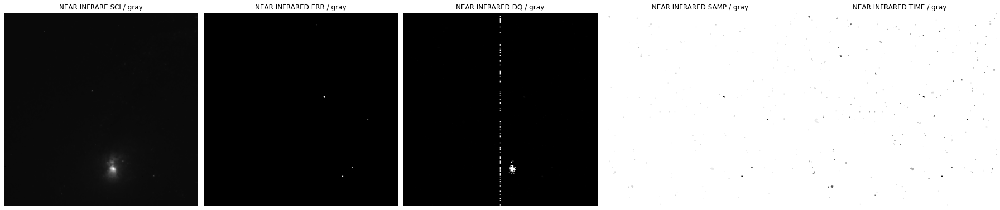

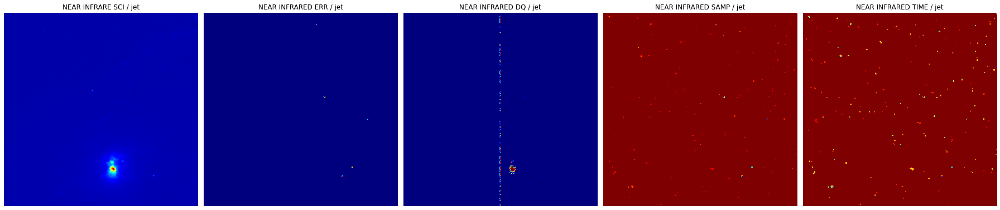

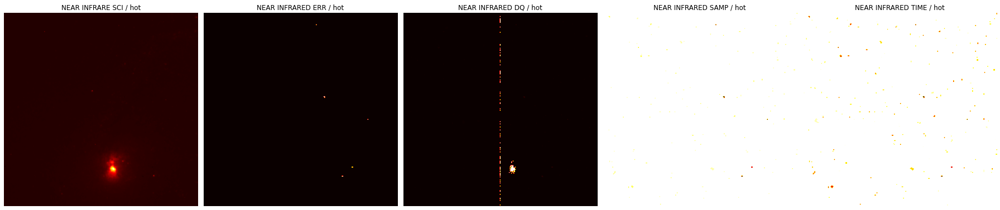

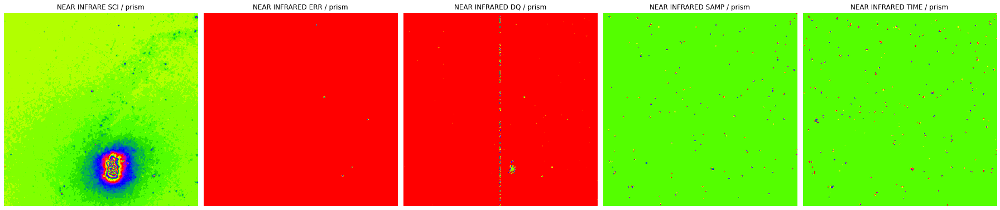

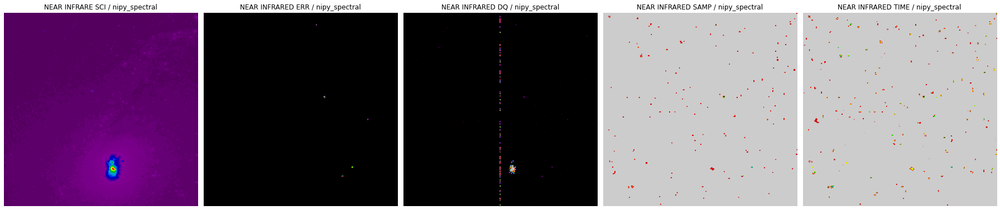

...

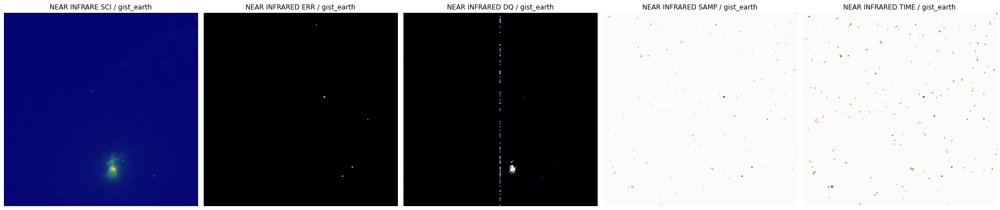

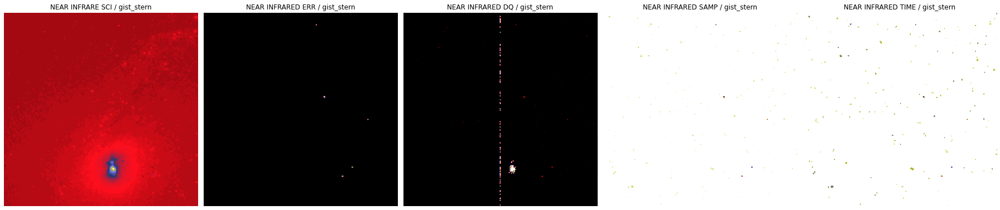

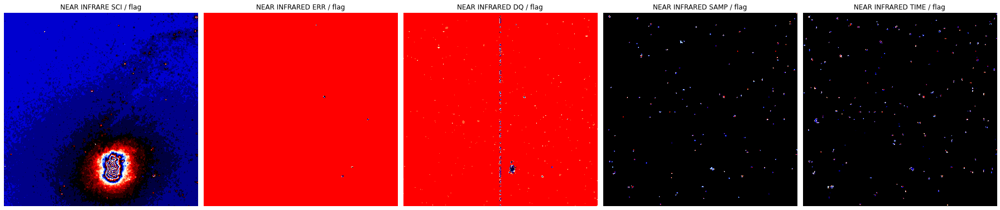

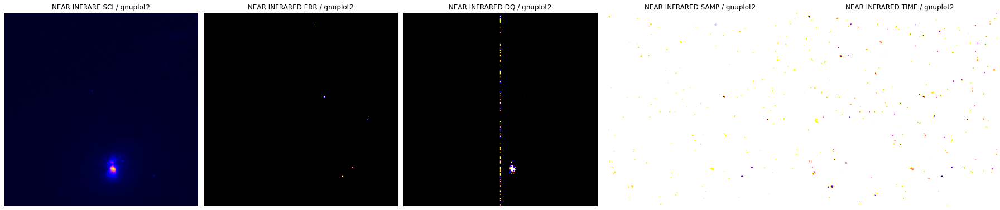

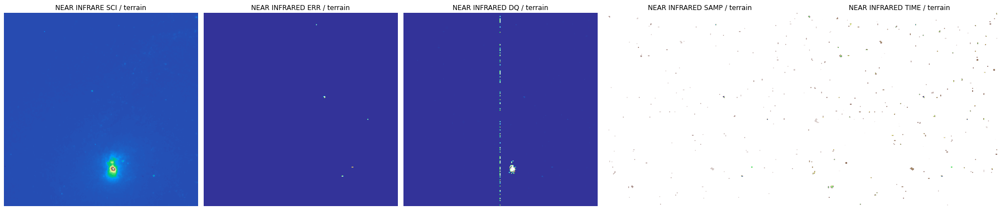

In [ ]:

for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,5,figsize=(25,25))
    
    axis[0].imshow(NI_SCI / 255.,cmap=x_spec) #TARGET
    axis[0].set_title("NEAR INFRARE SCI" + " / "+ x_spec)
    axis[0].axis("off")
    
    axis[1].imshow(NI_ERR / 255.,cmap=x_spec)
    axis[1].set_title("NEAR INFRARED ERR" + " / "+ x_spec)
    axis[1].axis("off")
    
    axis[2].imshow(NI_DQ / 255.,cmap=x_spec)
    axis[2].set_title("NEAR INFRARED DQ" + " / "+ x_spec)
    axis[2].axis("off")
    
    axis[3].imshow(NI_SAMP / 255.,cmap=x_spec)
    axis[3].set_title("NEAR INFRARED SAMP" + " / "+ x_spec)
    axis[3].axis("off")
    
    axis[4].imshow(NI_TIME / 255.,cmap=x_spec)
    axis[4].set_title("NEAR INFRARED TIME" + " / "+ x_spec)
    axis[4].axis("off")
    
    plt.tight_layout()
    plt.show()


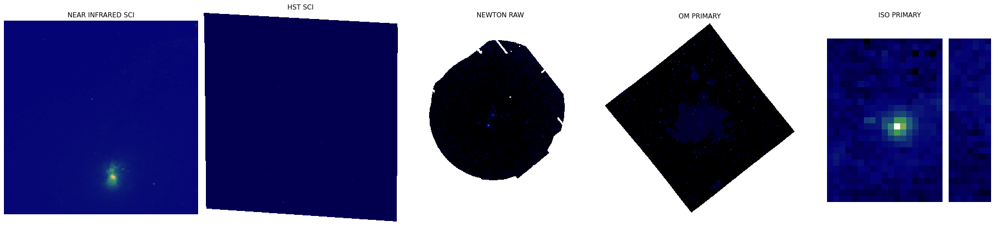

In [ ]:
figure,axis = plt.subplots(1,5,figsize=(25,25))
    
axis[0].imshow(NI_SCI / 255.,cmap="gist_earth")
axis[0].set_title("NEAR INFRARED SCI")
axis[0].axis("off")
    
axis[1].imshow(HST_SCI / 255.,cmap="gist_earth")
axis[1].set_title("HST SCI")
axis[1].axis("off")
    
axis[2].imshow(NEWTON_RAW[2] / 255.,cmap="gist_earth")
axis[2].set_title("NEWTON RAW")
axis[2].axis("off")
    
axis[3].imshow(OM_PRIMARY / 255.,cmap="gist_earth")
axis[3].set_title("OM PRIMARY")
axis[3].axis("off")
    
axis[4].imshow(ISO_PRIMARY[1] / 255.,cmap="gist_earth")
axis[4].set_title("ISO PRIMARY")
axis[4].axis("off")
    
plt.tight_layout()
plt.show()

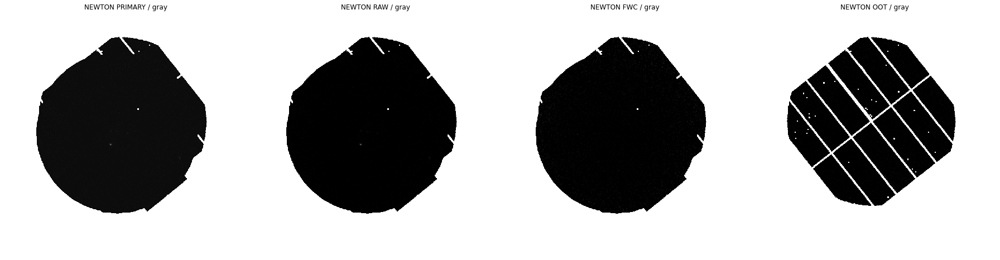

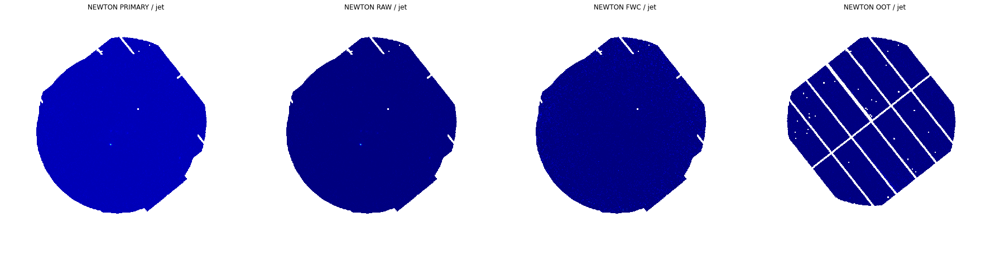

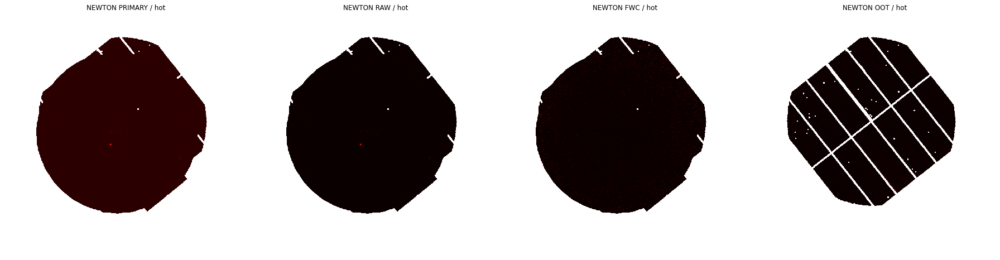

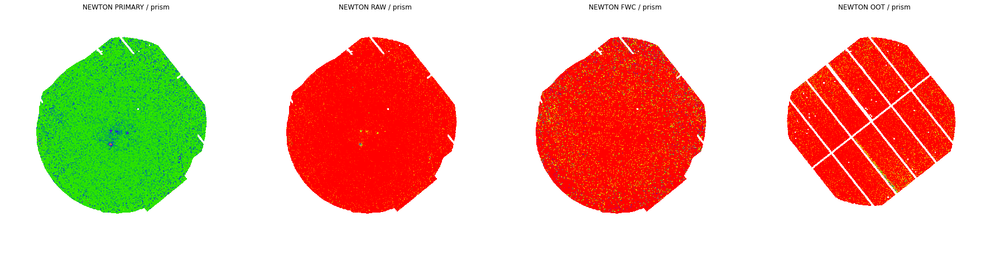

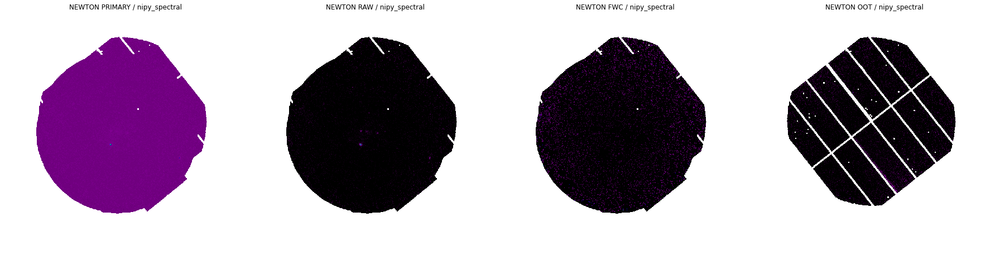

...

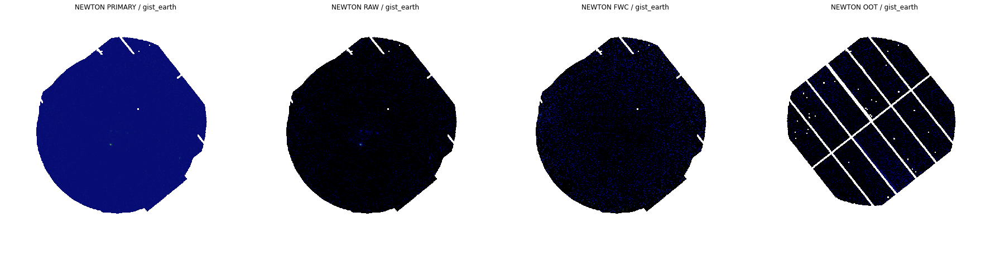

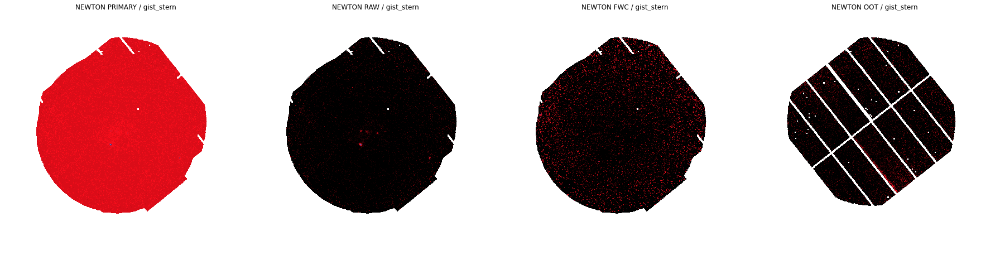

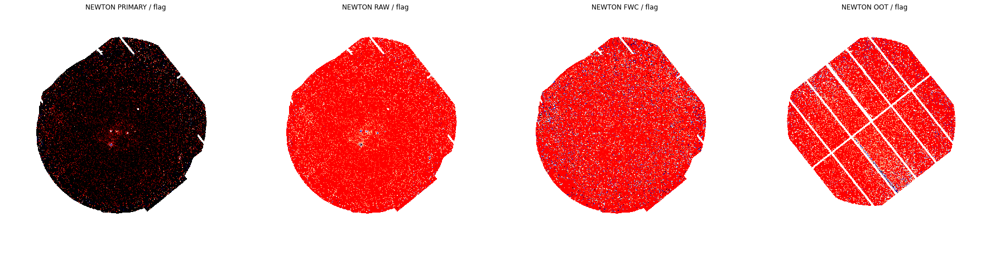

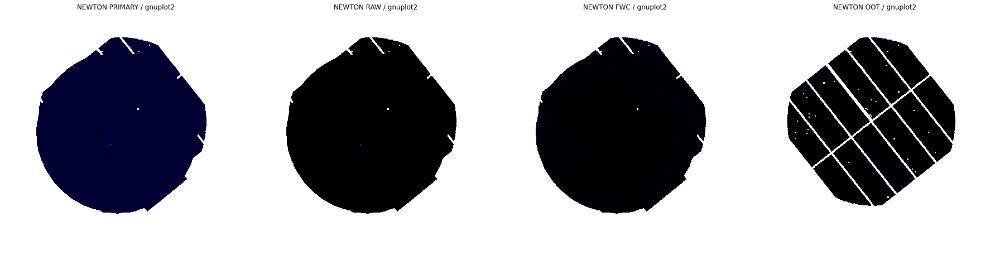

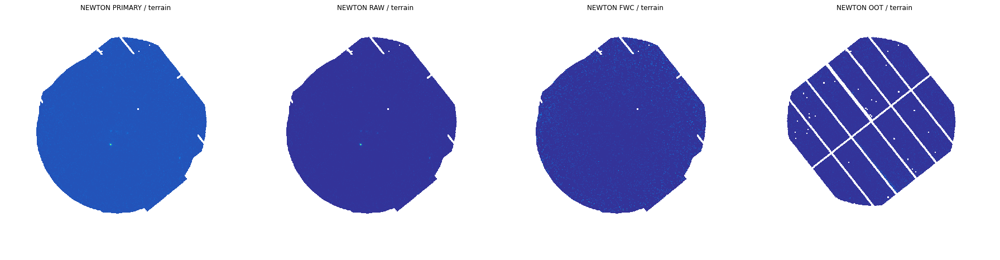

In [ ]:

for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,4,figsize=(25,25))
    
    axis[0].imshow(NEWTON_PRIMARY[0] / 255.,cmap=x_spec)
    axis[0].set_title("NEWTON PRIMARY" + " / "+ x_spec)
    axis[0].axis("off")
    
    axis[1].imshow(NEWTON_RAW[0] / 255.,cmap=x_spec)
    axis[1].set_title("NEWTON RAW" + " / "+ x_spec)
    axis[1].axis("off")
    
    axis[2].imshow(NEWTON_FWC[0] / 255.,cmap=x_spec)
    axis[2].set_title("NEWTON FWC" + " / "+ x_spec)
    axis[2].axis("off")
    
    axis[3].imshow(NEWTON_OOT[0] / 255.,cmap=x_spec)
    axis[3].set_title("NEWTON OOT" + " / "+ x_spec)
    axis[3].axis("off")
    
    plt.tight_layout()
    plt.show()

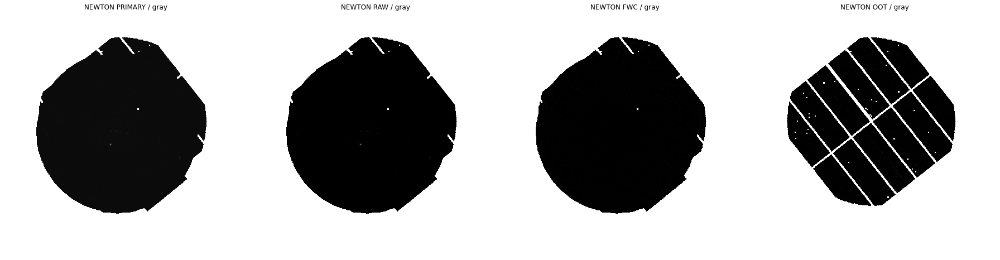

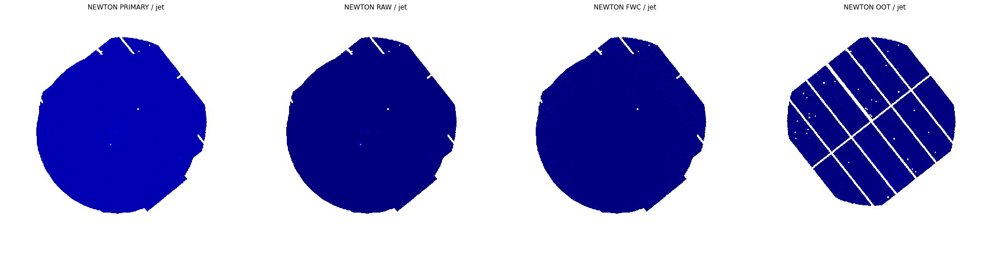

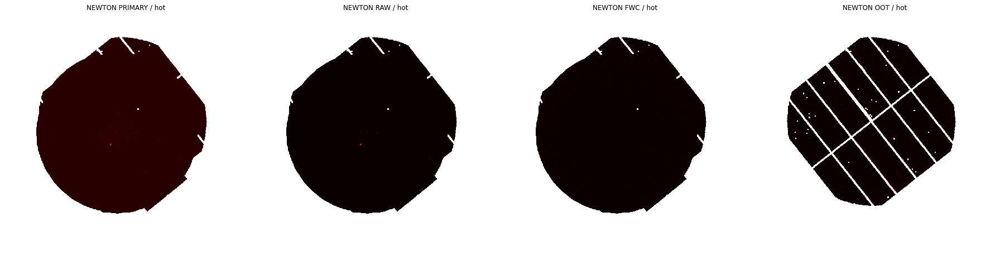

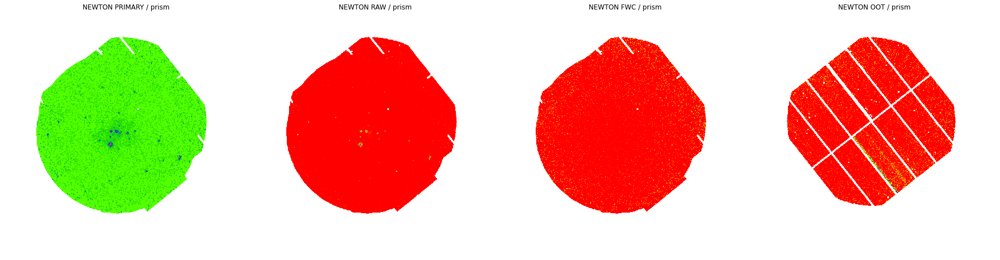

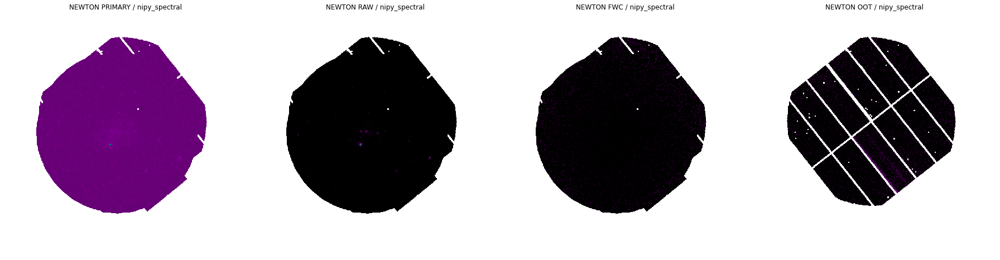

...

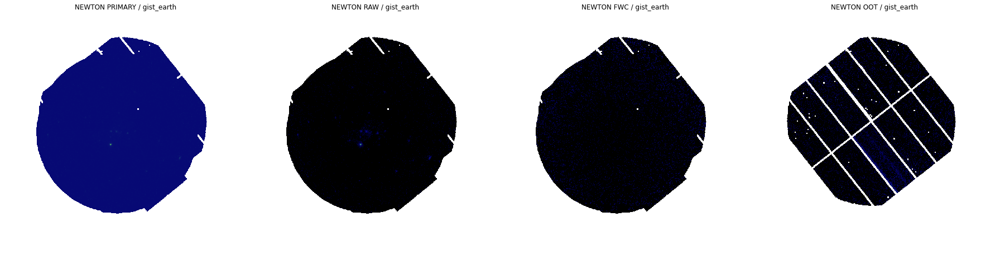

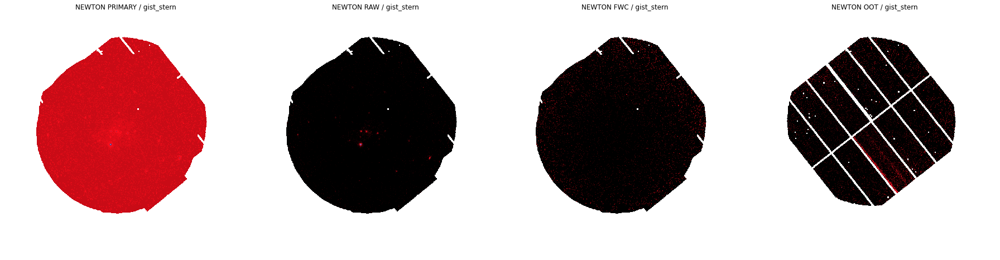

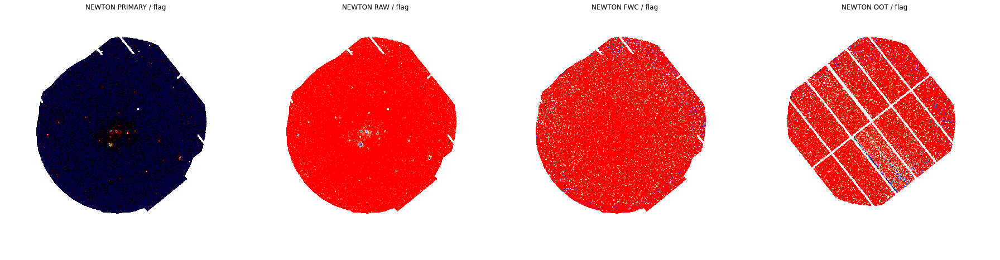

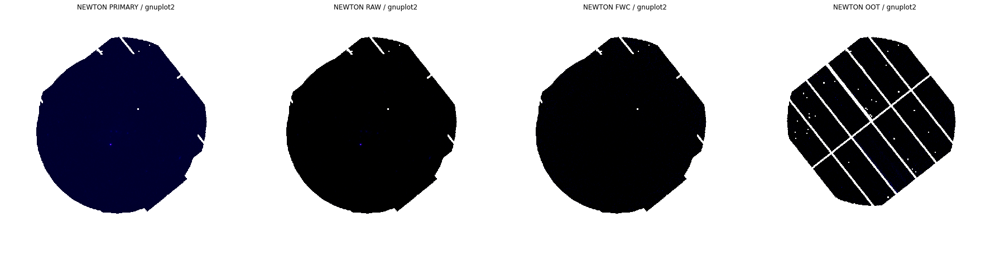

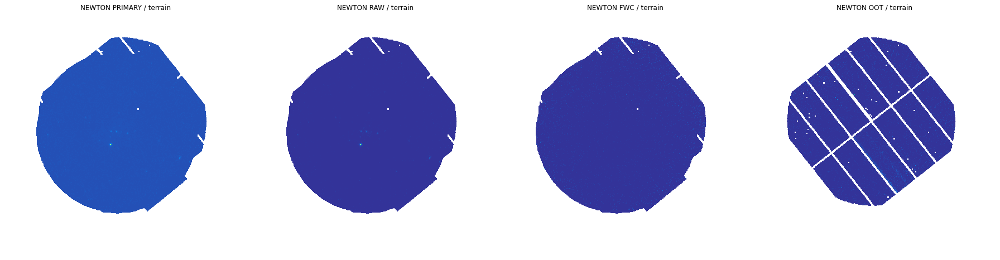

In [ ]:

for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,4,figsize=(25,25))
    
    axis[0].imshow(NEWTON_PRIMARY[1] / 255.,cmap=x_spec)
    axis[0].set_title("NEWTON PRIMARY" + " / "+ x_spec)
    axis[0].axis("off")
    
    axis[1].imshow(NEWTON_RAW[1] / 255.,cmap=x_spec) 
    axis[1].set_title("NEWTON RAW" + " / "+ x_spec)
    axis[1].axis("off")
    
    axis[2].imshow(NEWTON_FWC[1] / 255.,cmap=x_spec)
    axis[2].set_title("NEWTON FWC" + " / "+ x_spec)
    axis[2].axis("off")
    
    axis[3].imshow(NEWTON_OOT[1] / 255.,cmap=x_spec)
    axis[3].set_title("NEWTON OOT" + " / "+ x_spec)
    axis[3].axis("off")
    
    plt.tight_layout()
    plt.show()

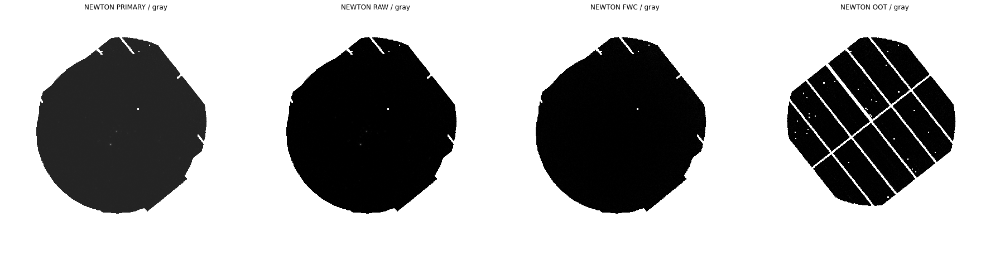

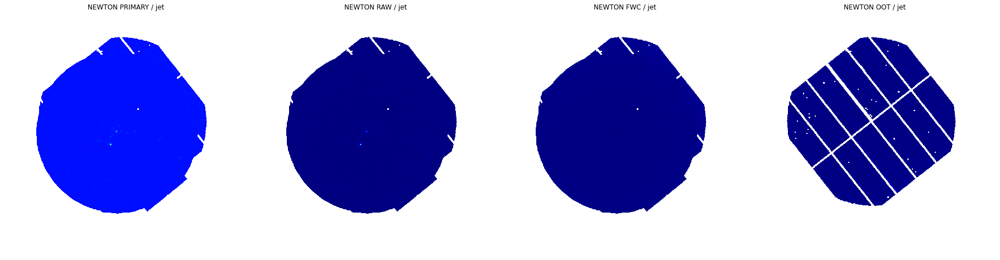

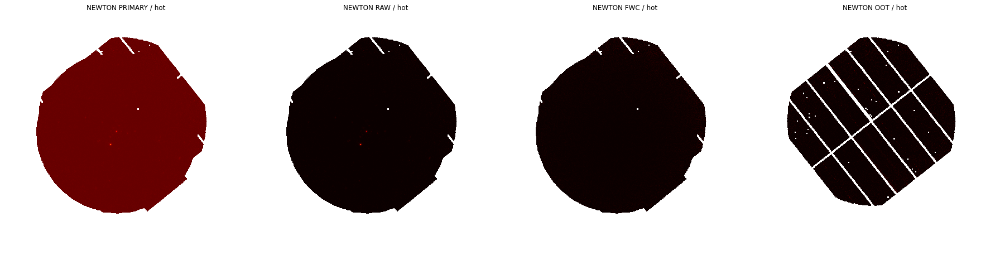

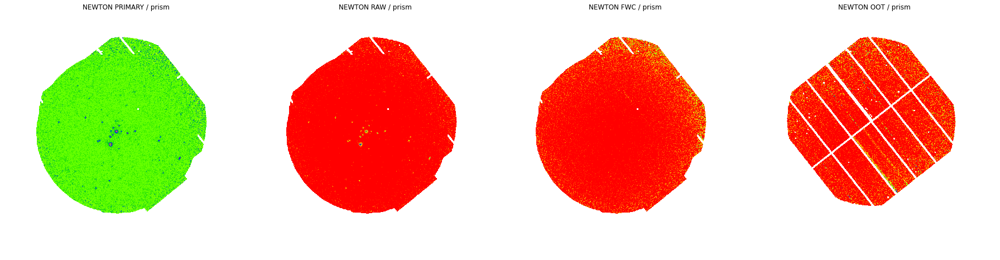

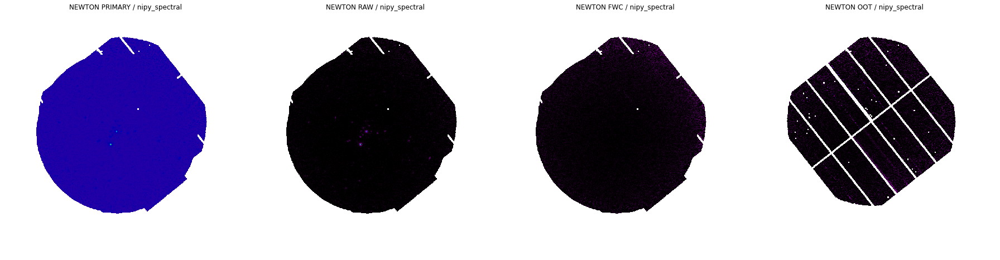

...

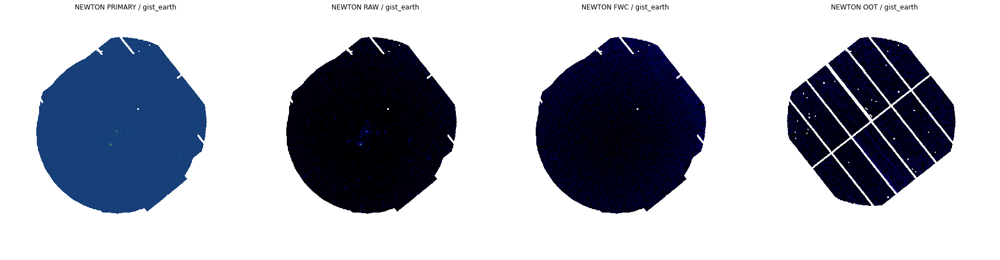

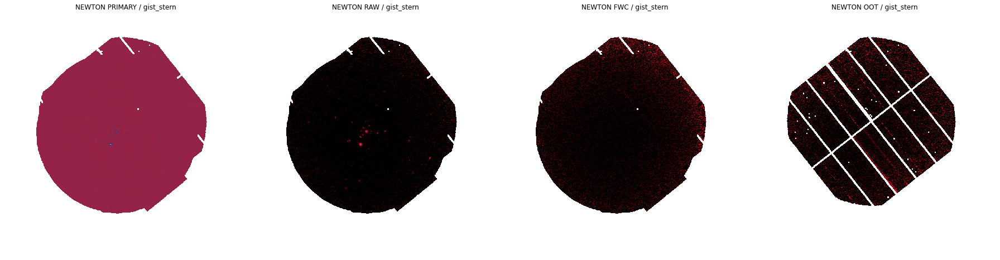

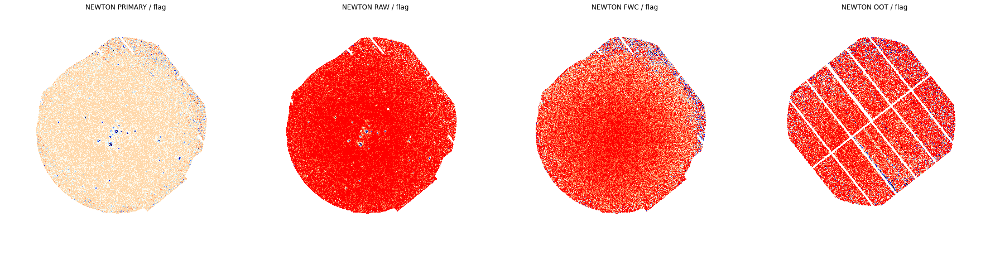

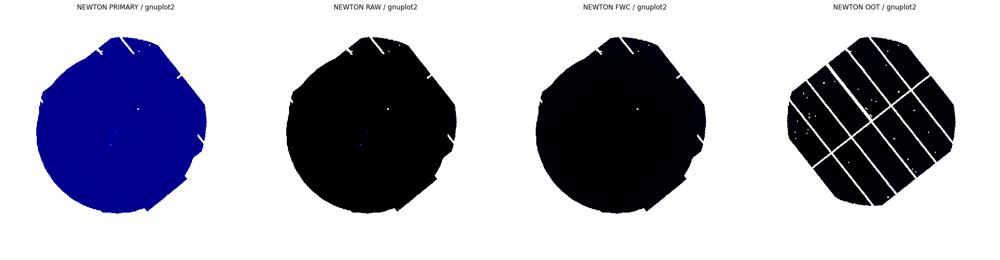

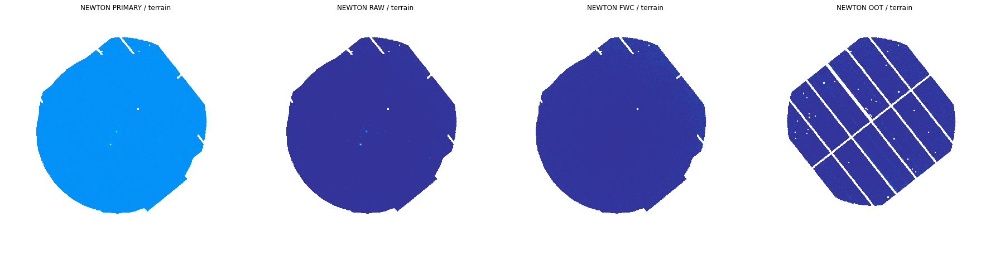

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,4,figsize=(25,25))
    
    axis[0].imshow(NEWTON_PRIMARY[2] / 255.,cmap=x_spec)
    axis[0].set_title("NEWTON PRIMARY" + " / "+ x_spec)
    axis[0].axis("off")
    
    axis[1].imshow(NEWTON_RAW[2] / 255.,cmap=x_spec)  #TARGET
    axis[1].set_title("NEWTON RAW" + " / "+ x_spec)
    axis[1].axis("off")
    
    axis[2].imshow(NEWTON_FWC[2] / 255.,cmap=x_spec)
    axis[2].set_title("NEWTON FWC" + " / "+ x_spec)
    axis[2].axis("off")
    
    axis[3].imshow(NEWTON_OOT[2] / 255.,cmap=x_spec)
    axis[3].set_title("NEWTON OOT" + " / "+ x_spec)
    axis[3].axis("off")
    
    plt.tight_layout()
    plt.show()

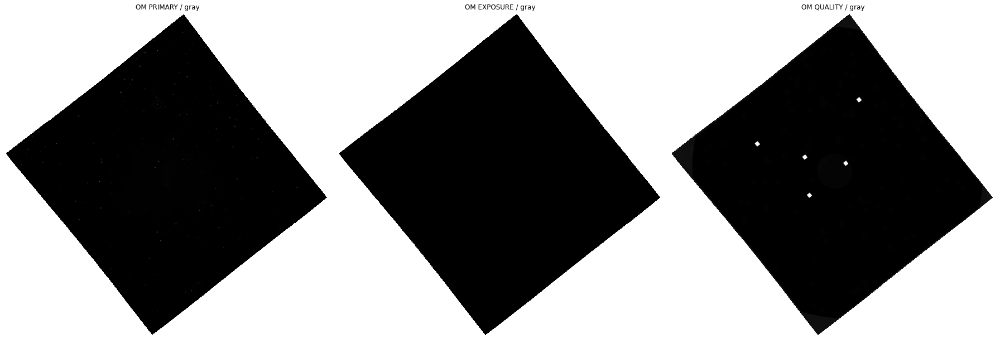

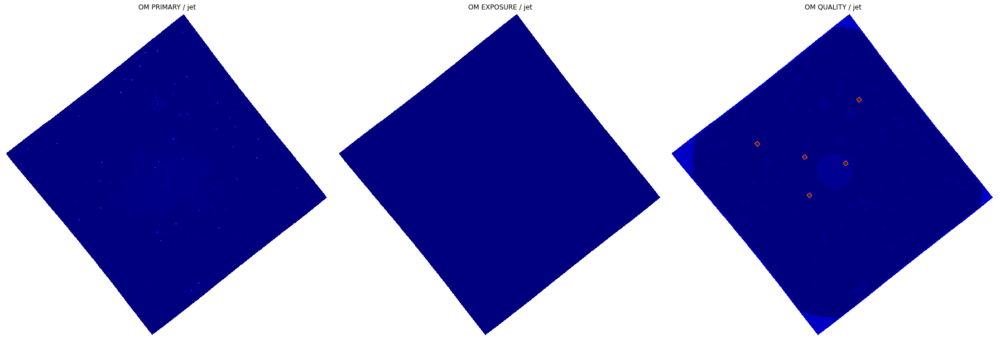

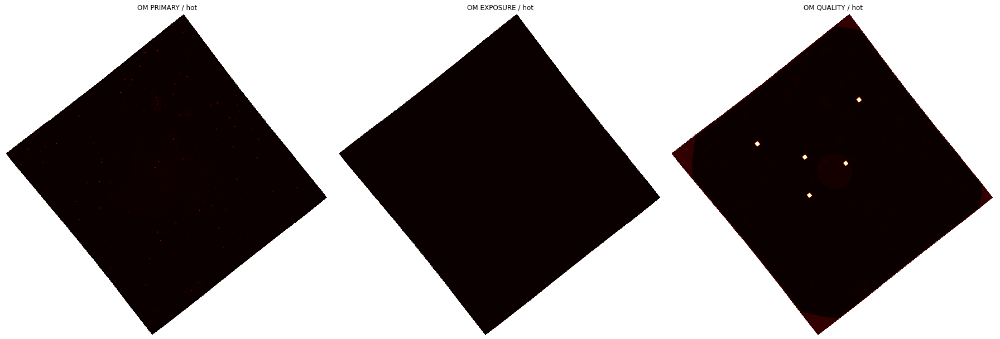

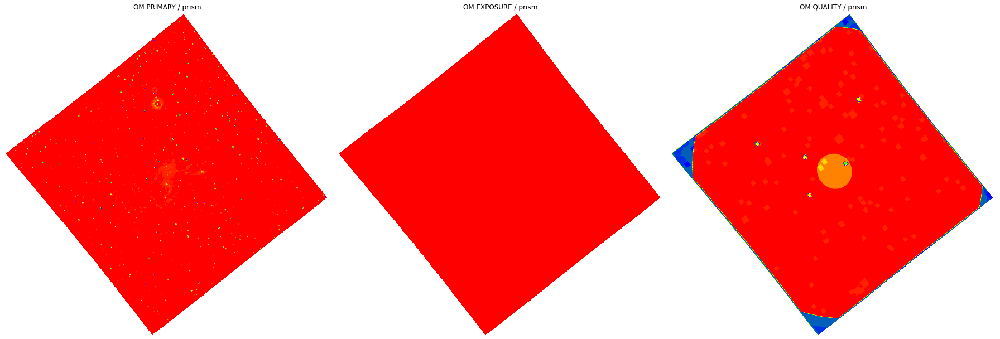

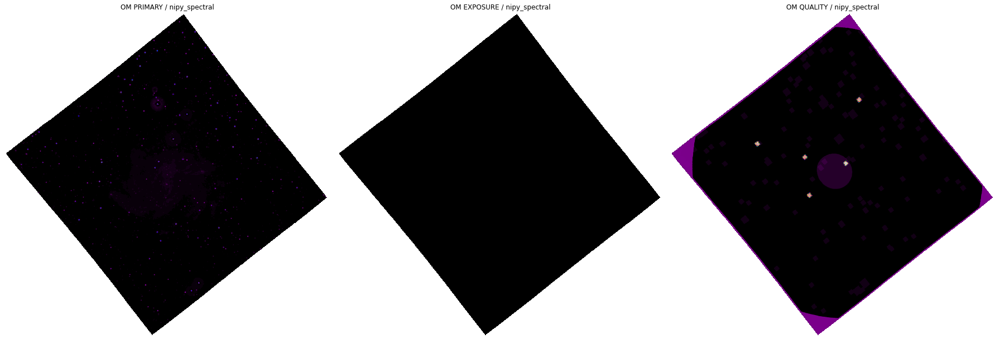

...

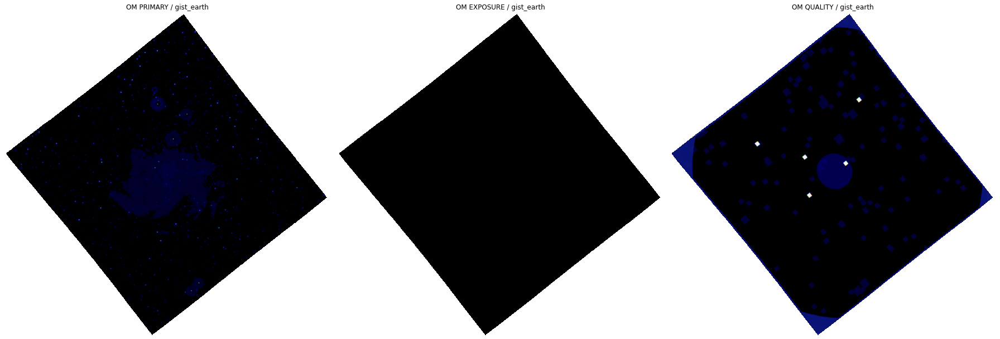

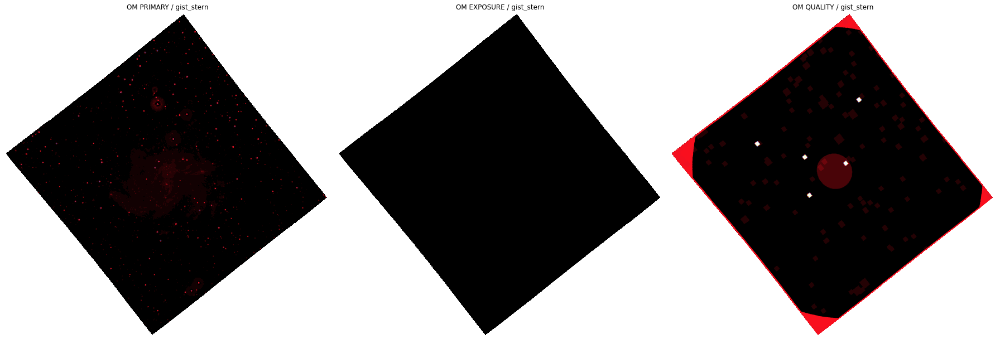

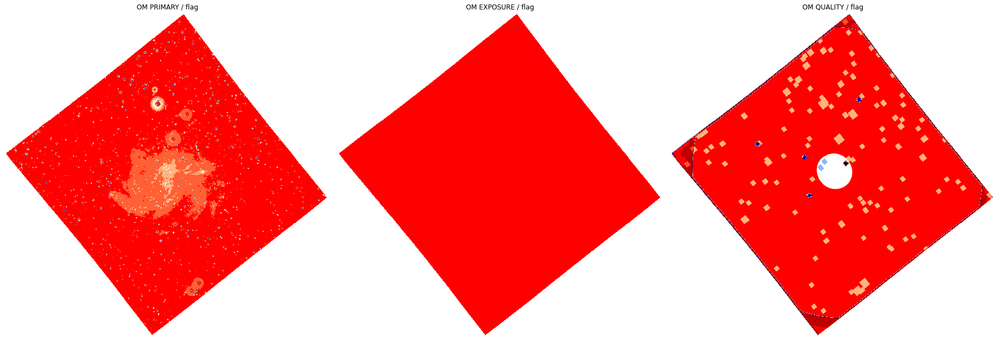

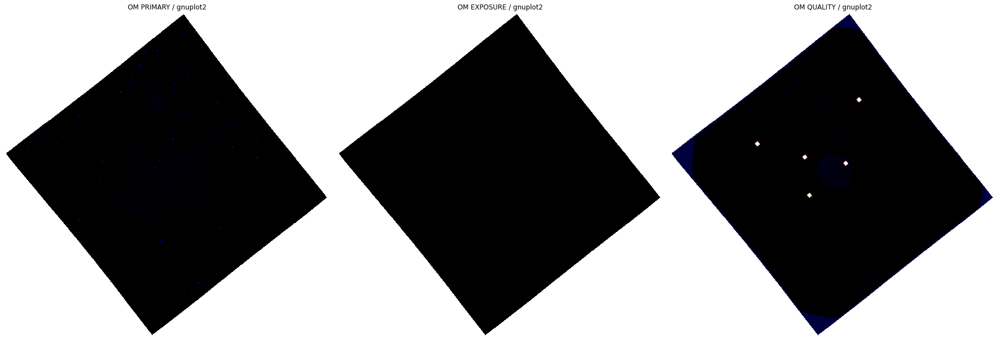

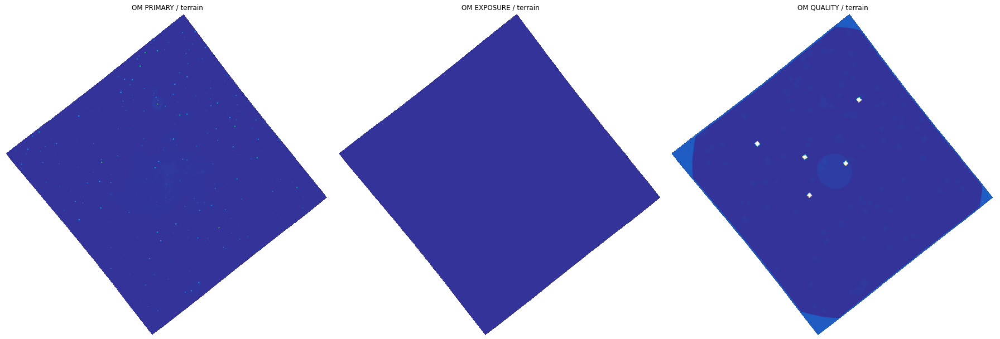

In [ ]:

for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,3,figsize=(25,25))
    
    axis[0].imshow(OM_PRIMARY / 255.,cmap=x_spec) #TARGET
    axis[0].set_title("OM PRIMARY" + " / "+ x_spec)
    axis[0].axis("off")
    
    axis[1].imshow(OM_EXPOSURE / 255.,cmap=x_spec)
    axis[1].set_title("OM EXPOSURE" + " / "+ x_spec)
    axis[1].axis("off")
    
    axis[2].imshow(OM_QUALITY / 255.,cmap=x_spec)
    axis[2].set_title("OM QUALITY" + " / "+ x_spec)
    axis[2].axis("off")
    
    plt.tight_layout()
    plt.show()

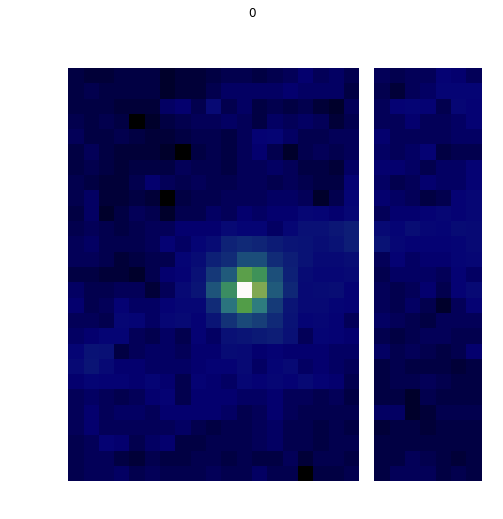

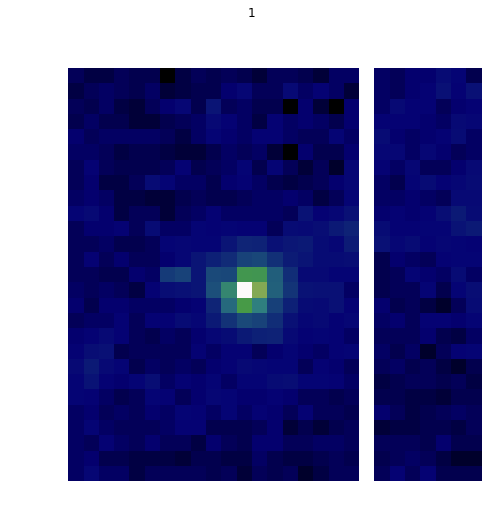

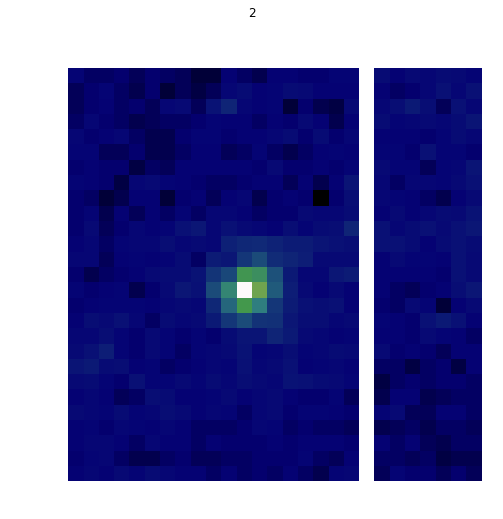

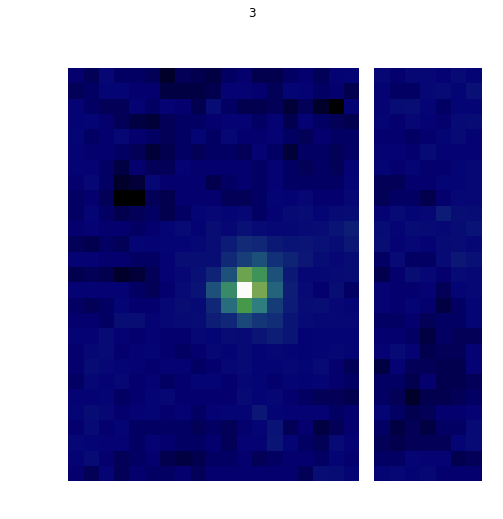

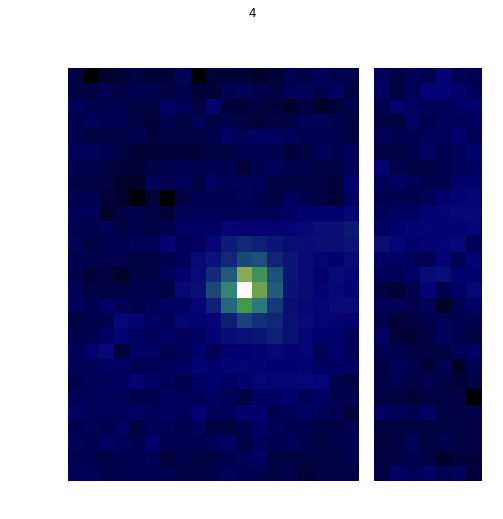

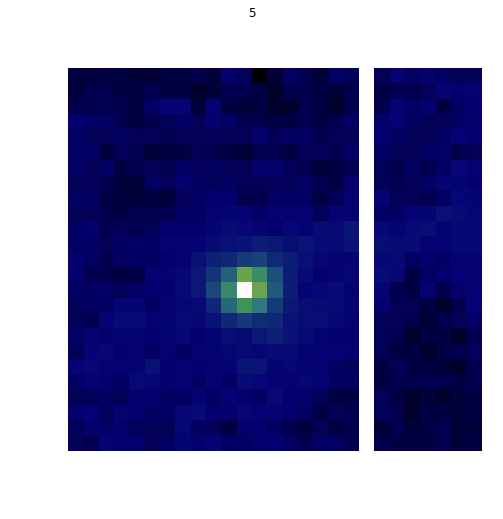

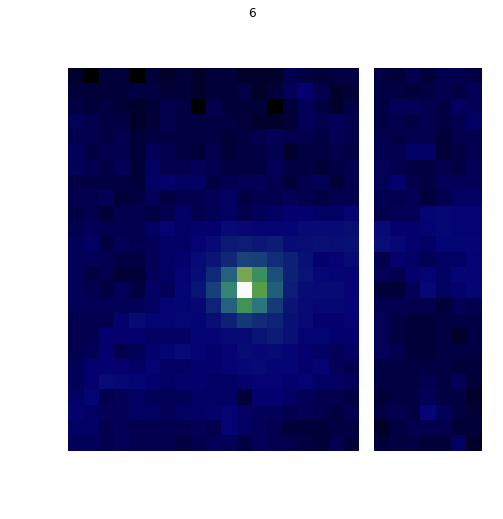

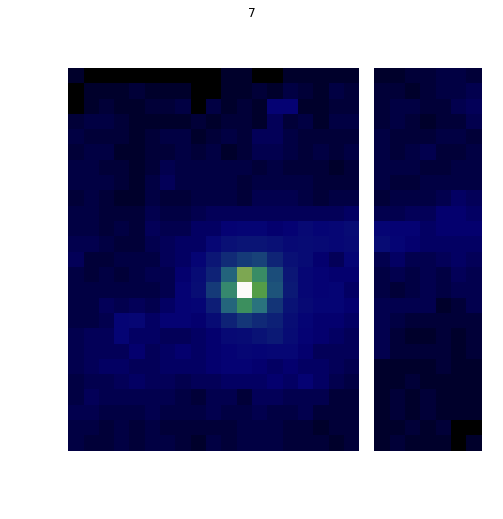

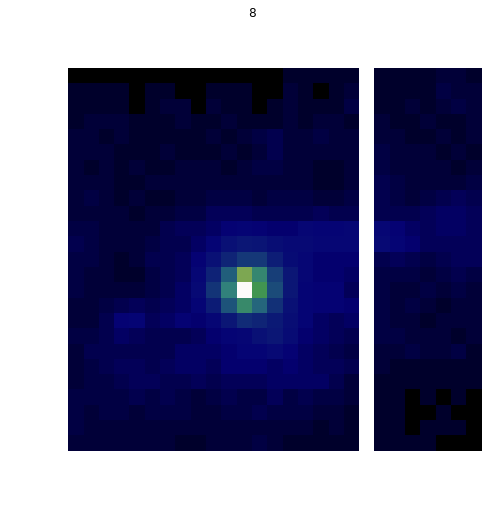

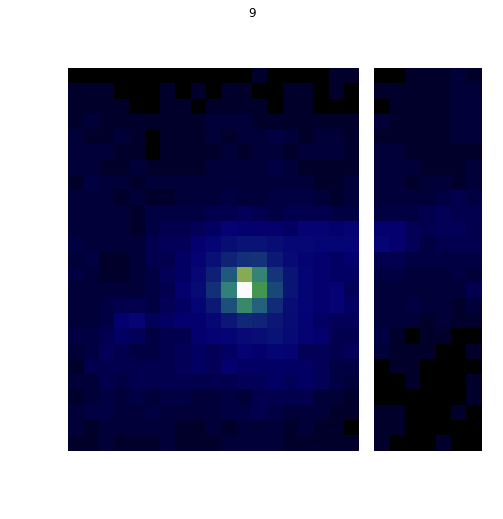

In [ ]:


for i_count in range(10):
    
    plt.figure(figsize=(9,9))
    plt.title(str(i_count))
    plt.axis("off")
    plt.imshow(ISO_PRIMARY[i_count],cmap="gist_earth")
    plt.show()
    
    # TARGET ISO_PRIMARY[1]

# STEP 14: selecting specific scale to vizualize nucleus and Manual interpretation

In [ ]:
WIDE_SCALE_NI = NI_SCI[90:,60:220]
ZOOMED_SCALE_NI = NI_SCI[150:,95:195]
NUCLEUS_SCALE_NI = NI_SCI[190:220,120:165]
WIDE_SCALE_HST = HST_SCI[700:4000,700:4000]
ZOOMED_SCALE_HST = HST_SCI[1800:3400,1700:3200]
ZOOMED_X2_SCALE_HST = HST_SCI[2100:3100,2000:3000]
ZOOMED_X3_SCALE_HST = HST_SCI[2450:2850,2300:2700]
NUCLEUS_SCALE_HST = HST_SCI[2640:2850,2330:2650]
WIDE_SCALE_NEWTON = NEWTON_RAW[2][155:480,160:440]
ZOOMED_SCALE_NEWTON = NEWTON_RAW[2][200:400,200:380]
NUCLEUS_SCALE_NEWTON = NEWTON_RAW[2][270:370,240:340]
WIDE_SCALE_OM = OM_PRIMARY[480:1070,350:1195]
ZOOMED_SCALE_OM = OM_PRIMARY[370:1055,420:1070]
NUCLEUS_SCALE_OM = OM_PRIMARY[500:950,500:950]

In [ ]:
ISO_CONS_SCALE = ISO_PRIMARY[1][:,7:22]

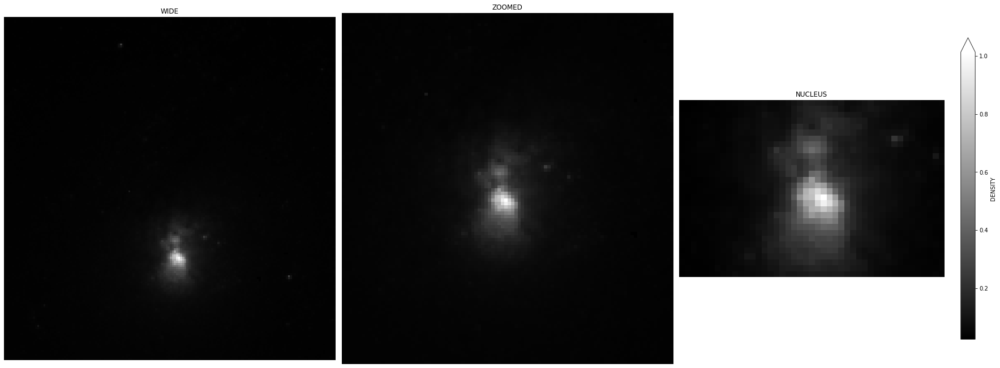

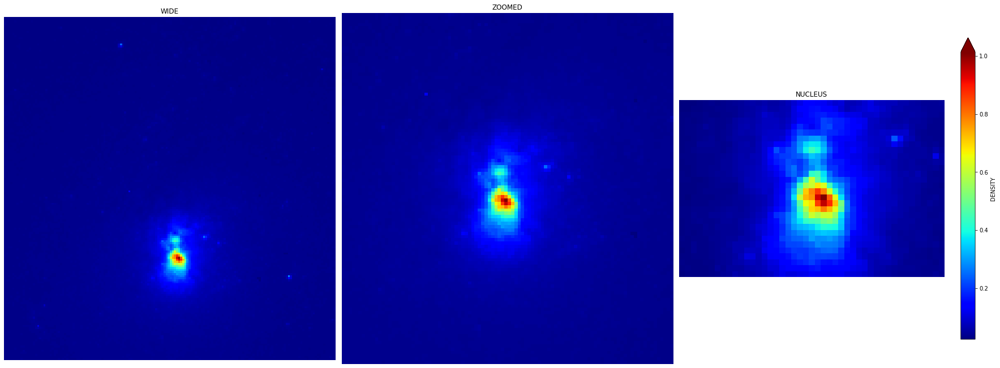

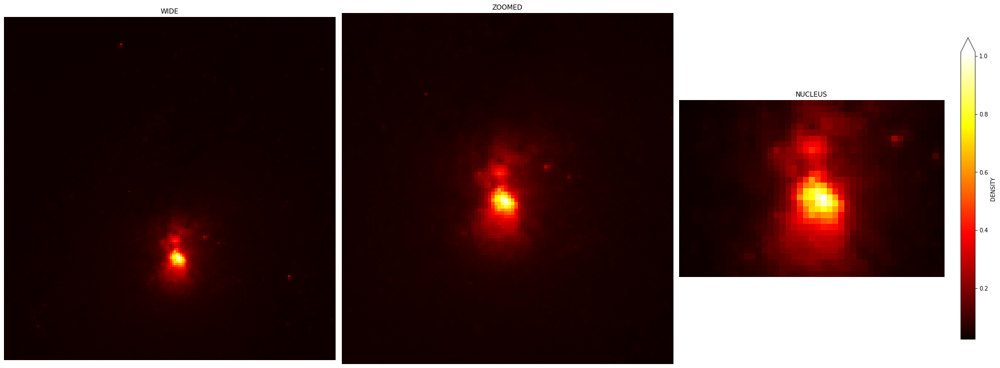

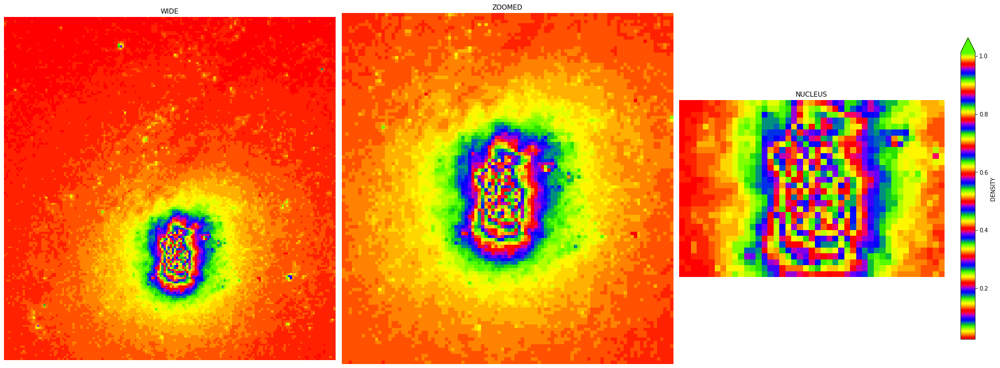

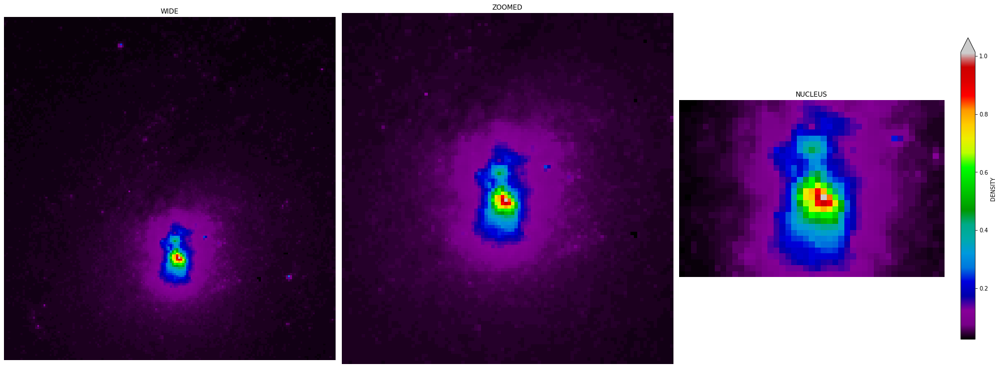

...

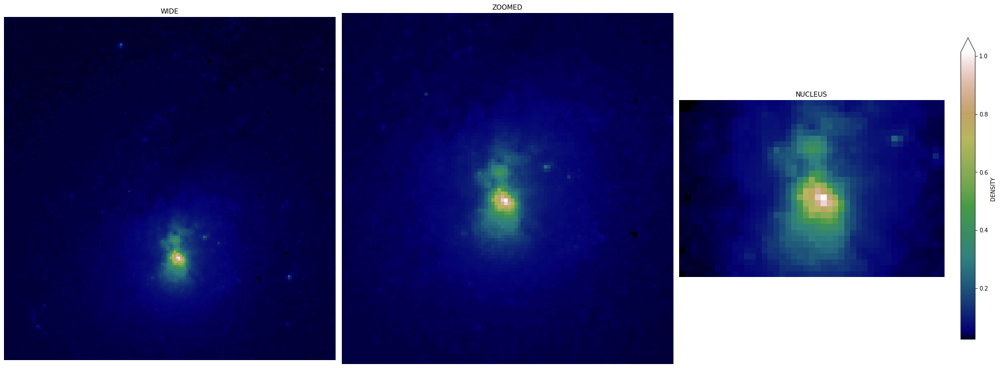

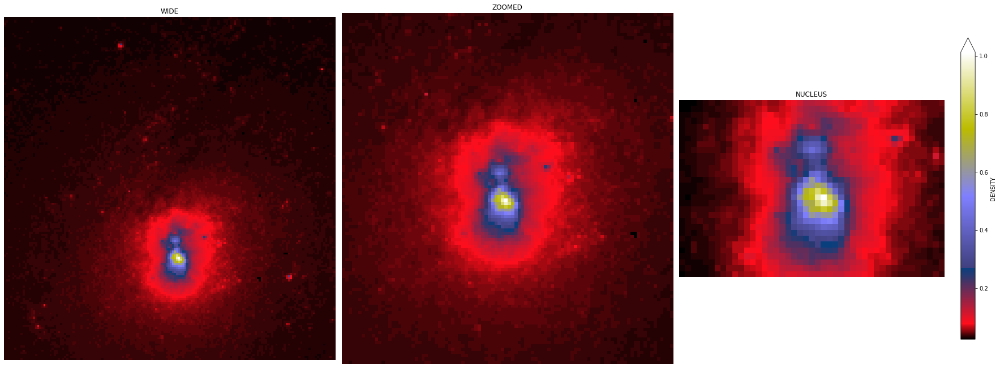

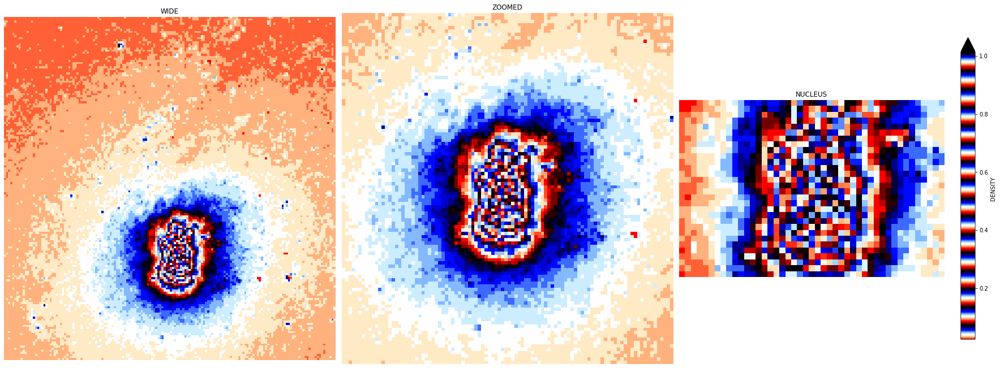

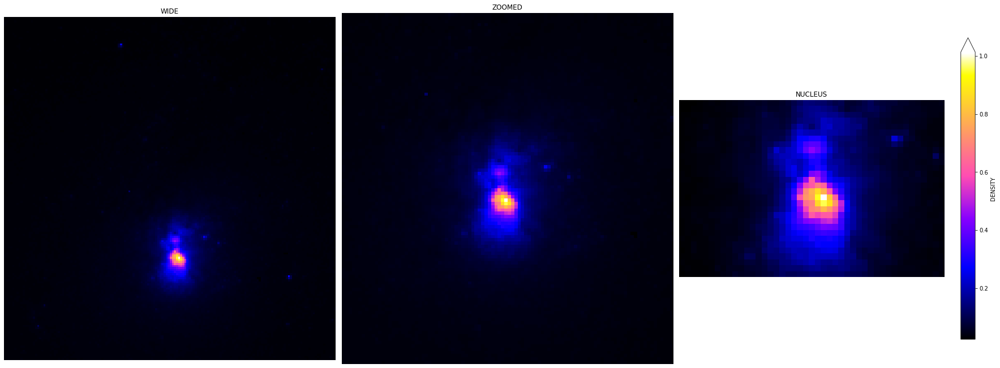

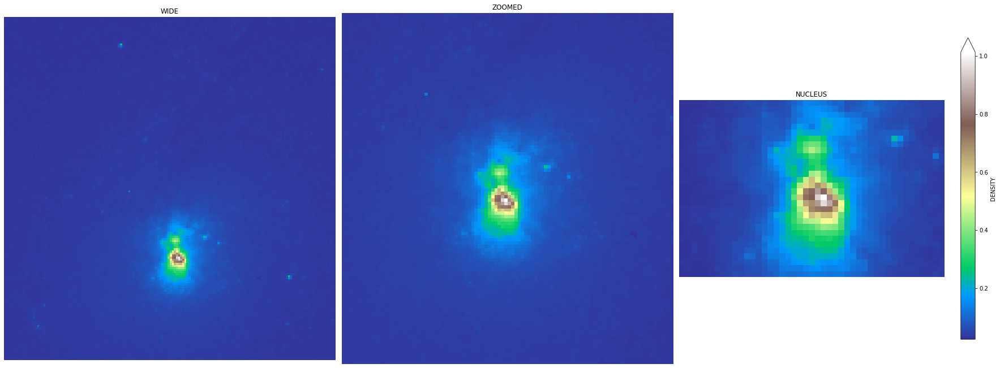

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,3,figsize=(25,25))

    axis[0].imshow(WIDE_SCALE_NI / 255.,cmap=x_spec)
    axis[0].set_title("WIDE")
    axis[0].axis("off")

    axis[1].imshow(ZOOMED_SCALE_NI / 255.,cmap=x_spec)
    axis[1].set_title("ZOOMED")
    axis[1].axis("off")

    DENSITY_FUNC = axis[2].imshow(NUCLEUS_SCALE_NI / 255.,cmap=x_spec)
    axis[2].set_title("NUCLEUS")
    axis[2].axis("off")

    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",extend="max")
    plt.tight_layout()
    plt.show()

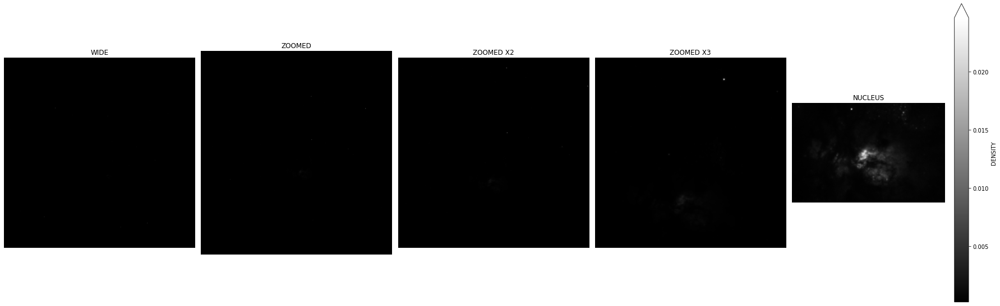

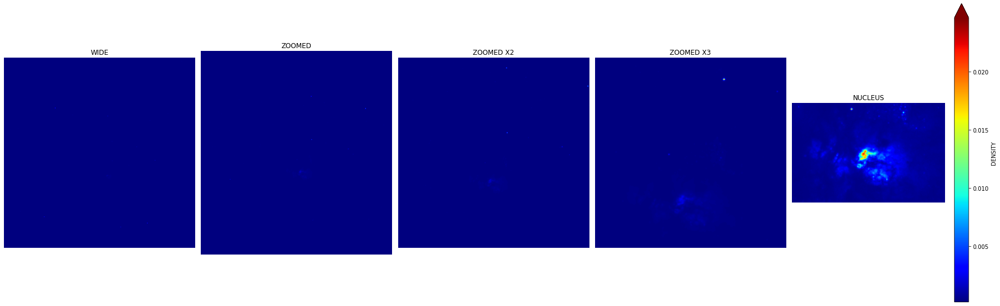

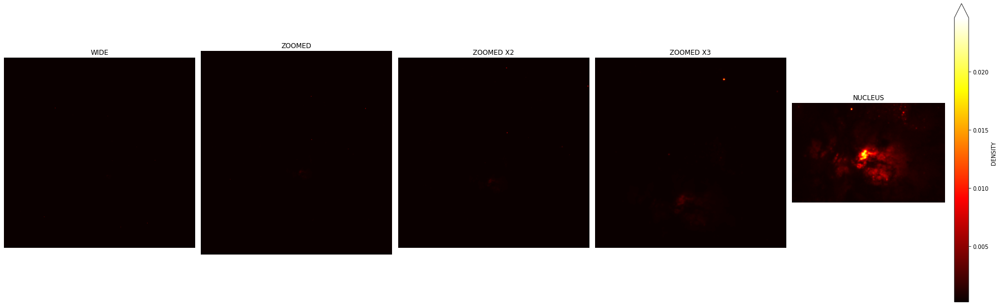

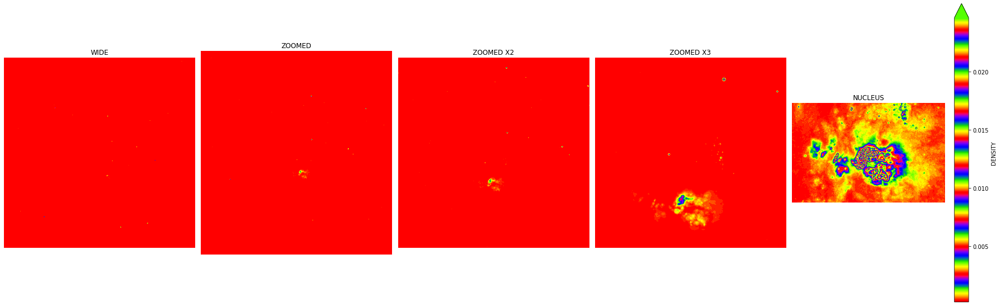

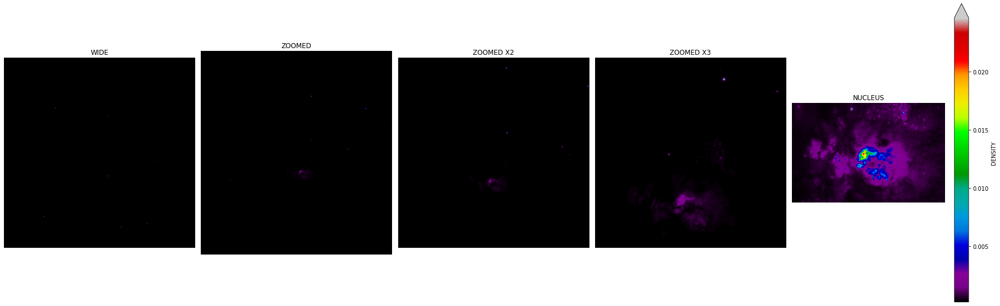

...

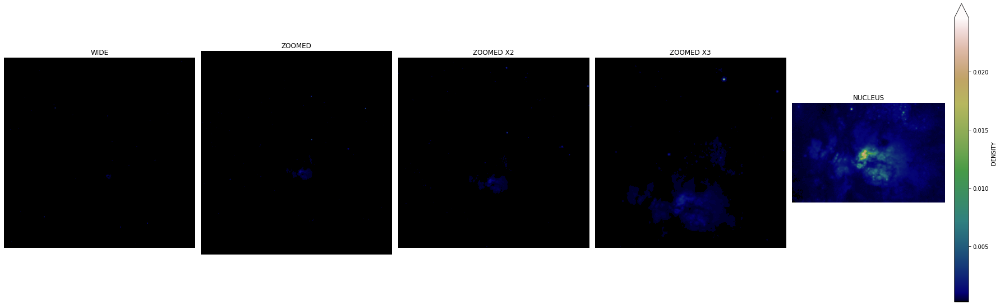

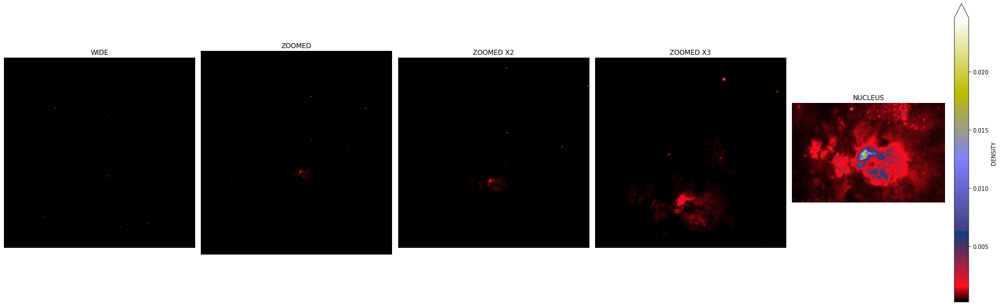

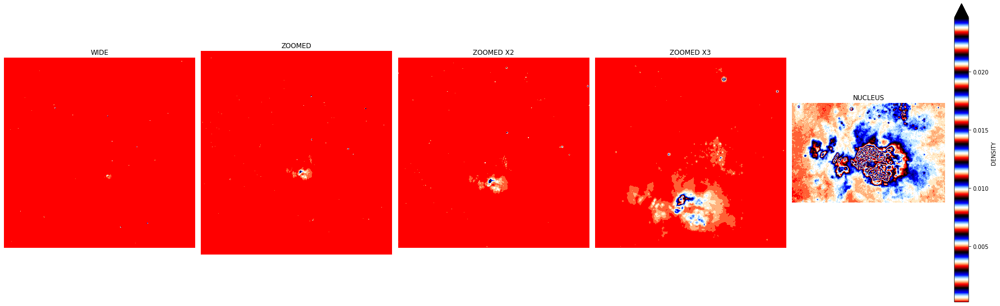

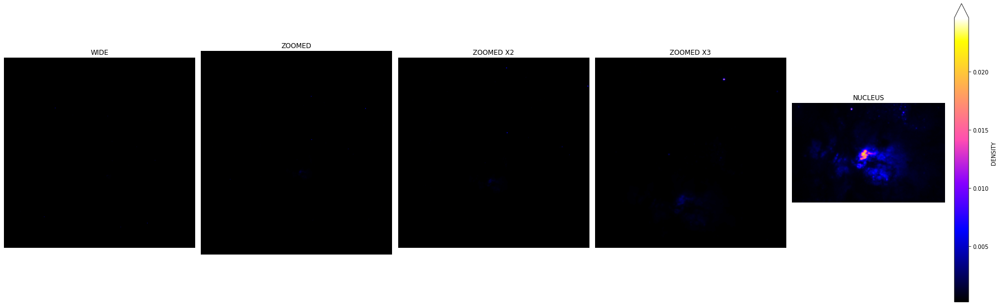

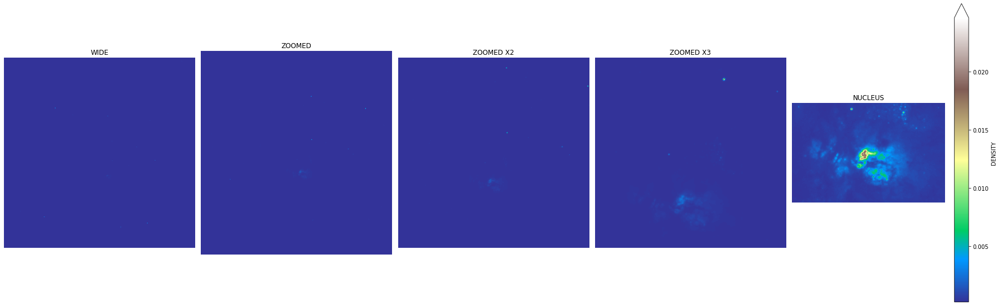

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,5,figsize=(25,25))

    axis[0].imshow(WIDE_SCALE_HST / 255.,cmap=x_spec)
    axis[0].set_title("WIDE")
    axis[0].axis("off")

    axis[1].imshow(ZOOMED_SCALE_HST / 255.,cmap=x_spec)
    axis[1].set_title("ZOOMED")
    axis[1].axis("off")
    
    axis[2].imshow(ZOOMED_X2_SCALE_HST / 255.,cmap=x_spec)
    axis[2].set_title("ZOOMED X2")
    axis[2].axis("off")
    
    axis[3].imshow(ZOOMED_X3_SCALE_HST / 255.,cmap=x_spec)
    axis[3].set_title("ZOOMED X3")
    axis[3].axis("off")

    DENSITY_FUNC = axis[4].imshow(NUCLEUS_SCALE_HST / 255.,cmap=x_spec)
    axis[4].set_title("NUCLEUS")
    axis[4].axis("off")

    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",extend="max")
    plt.tight_layout()
    plt.show()

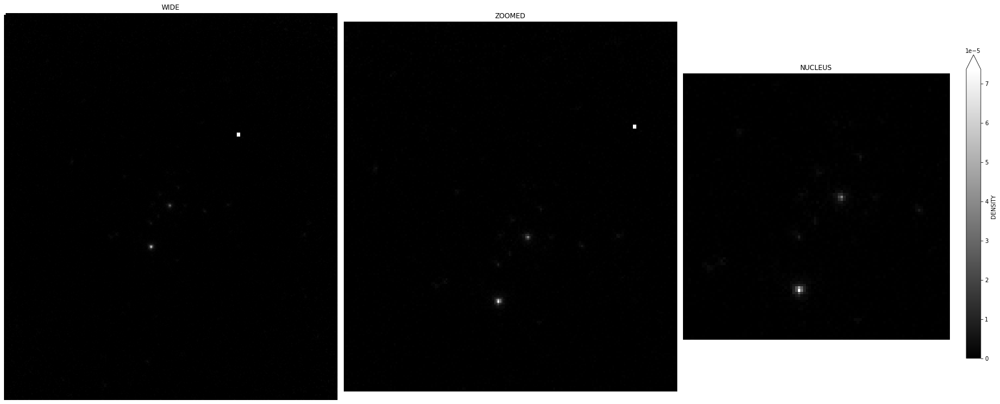

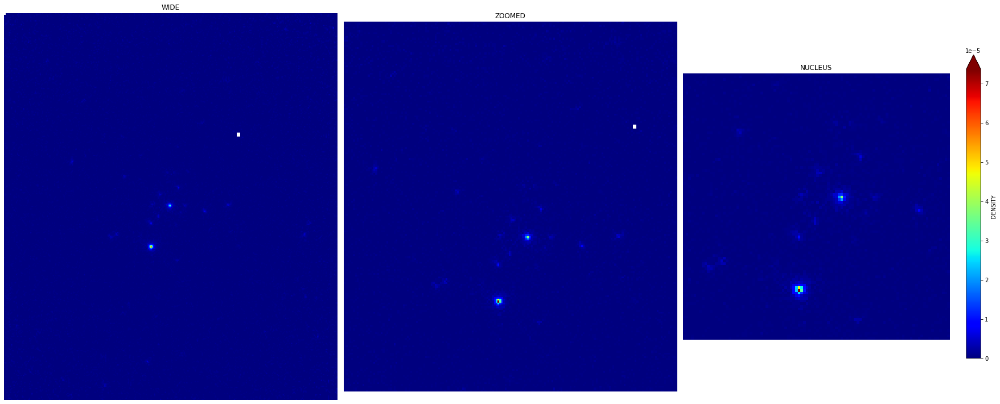

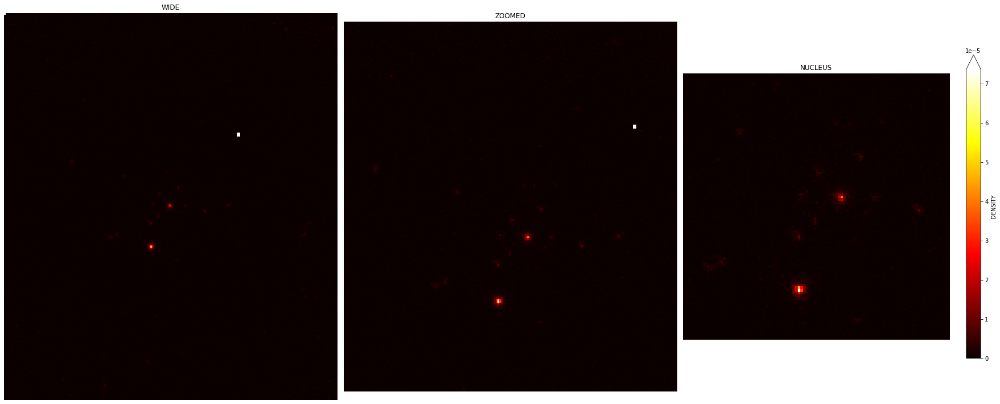

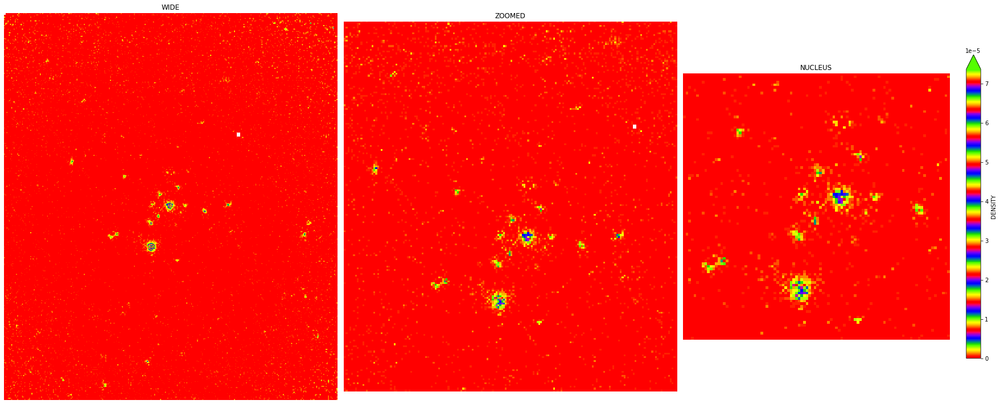

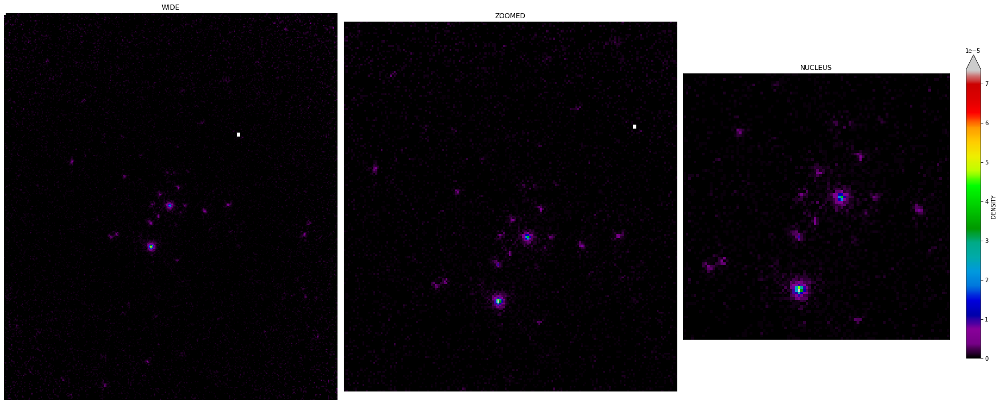

...

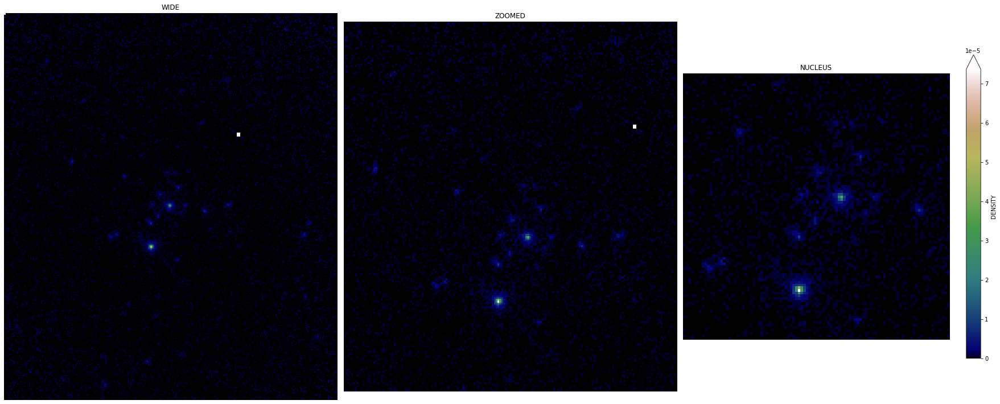

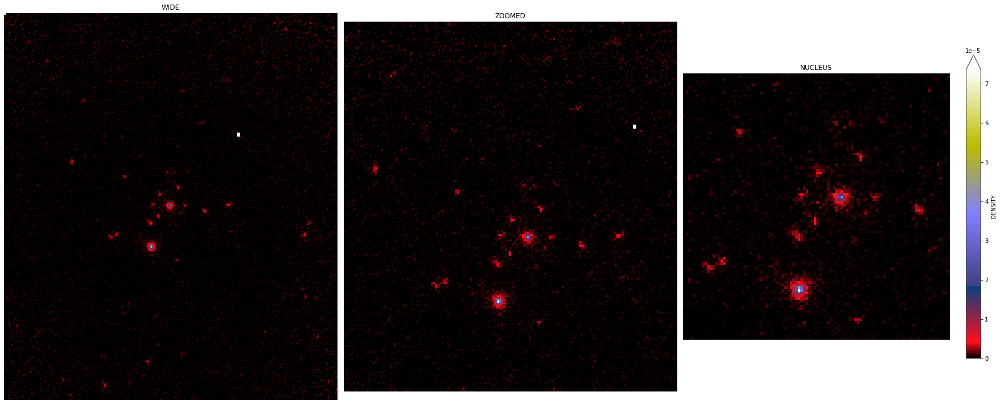

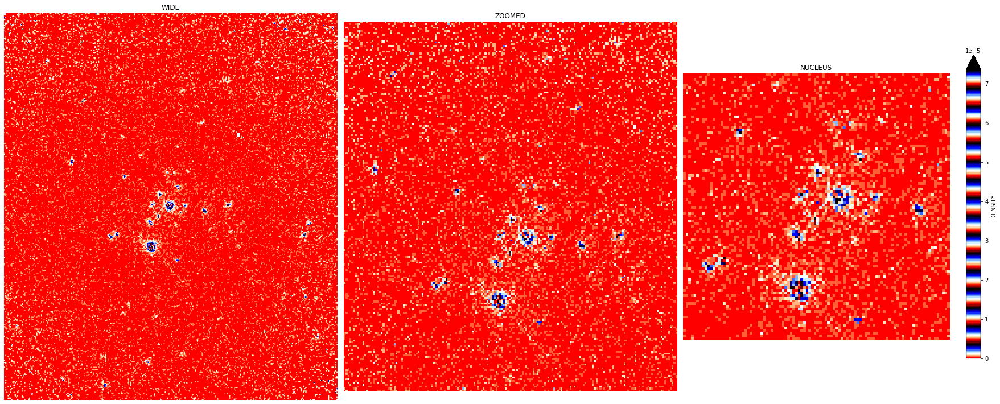

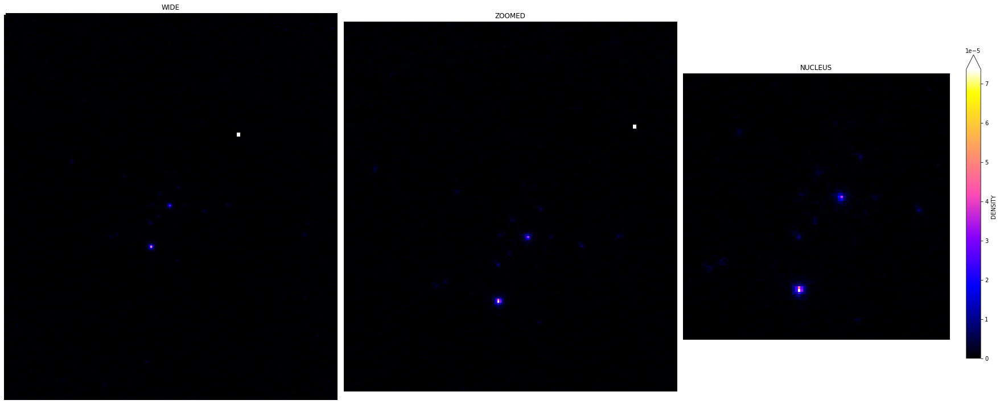

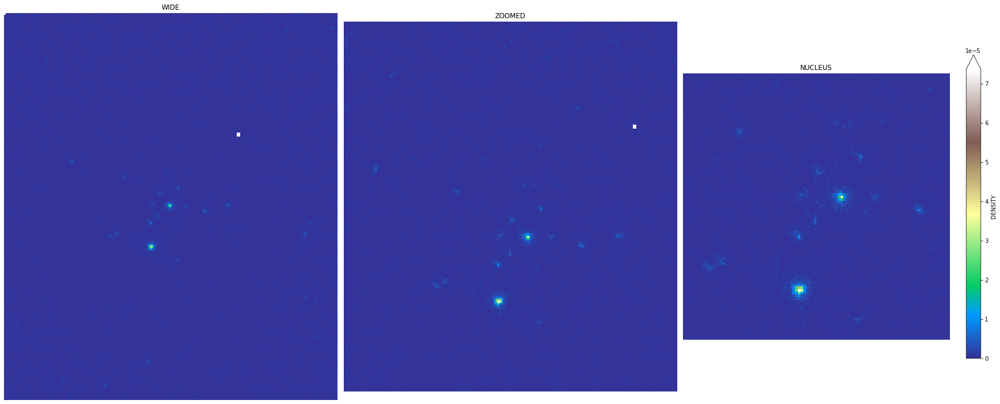

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,3,figsize=(25,25))

    axis[0].imshow(WIDE_SCALE_NEWTON / 255.,cmap=x_spec)
    axis[0].set_title("WIDE")
    axis[0].axis("off")

    axis[1].imshow(ZOOMED_SCALE_NEWTON / 255.,cmap=x_spec)
    axis[1].set_title("ZOOMED")
    axis[1].axis("off")

    DENSITY_FUNC = axis[2].imshow(NUCLEUS_SCALE_NEWTON / 255.,cmap=x_spec)
    axis[2].set_title("NUCLEUS")
    axis[2].axis("off")

    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",extend="max")
    plt.tight_layout()
    plt.show()

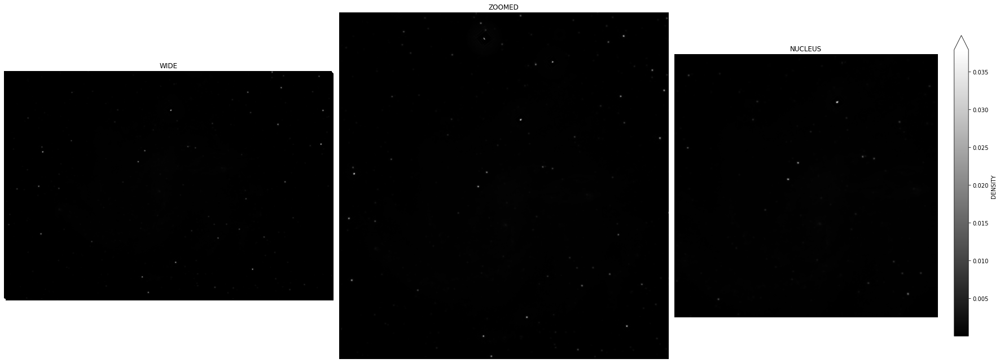

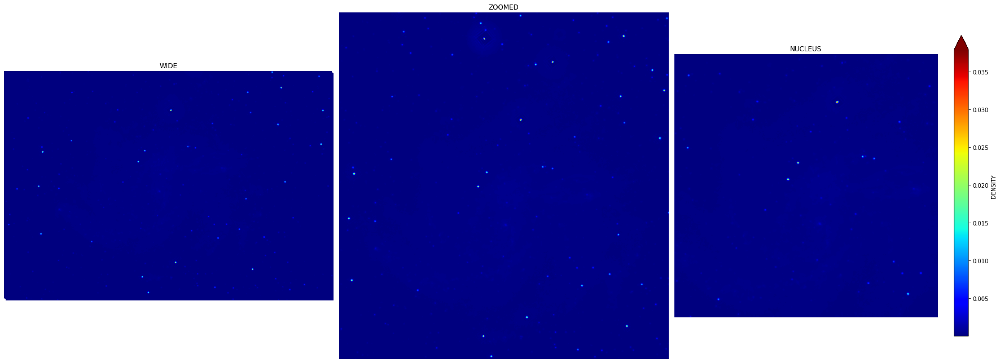

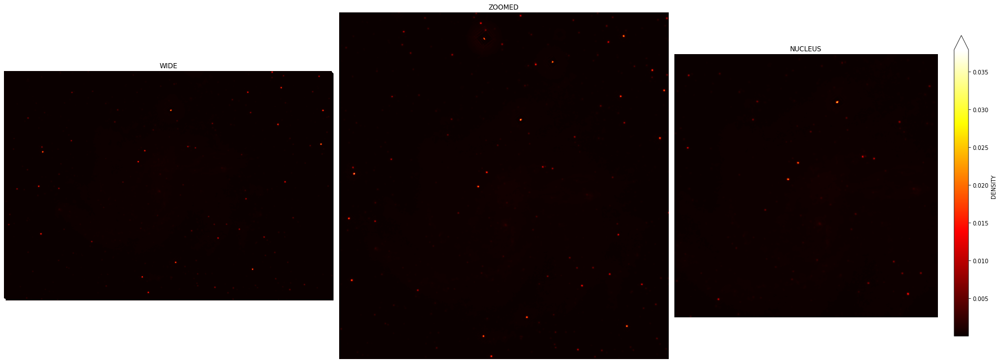

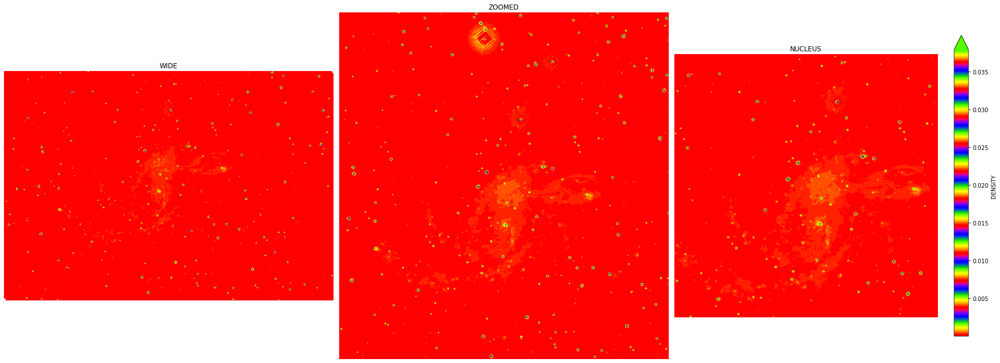

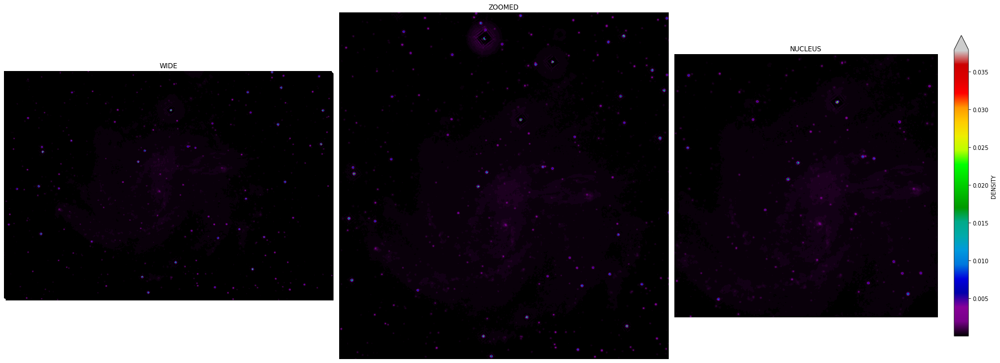

...

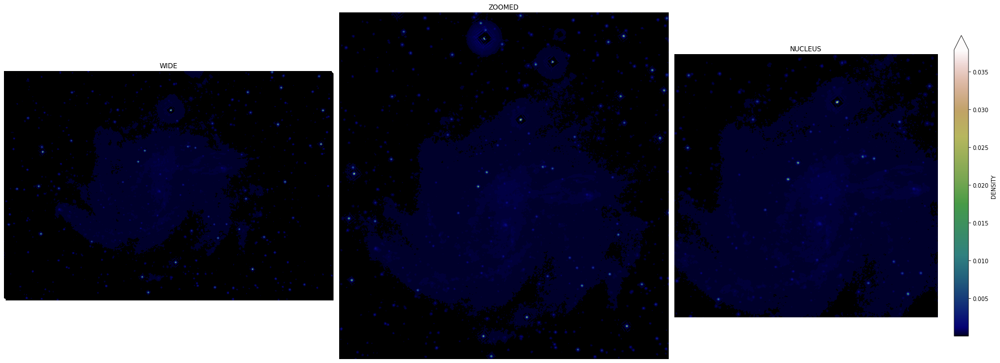

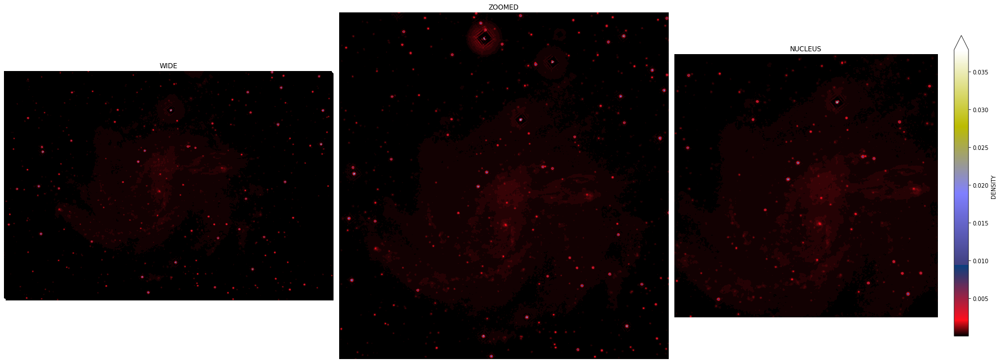

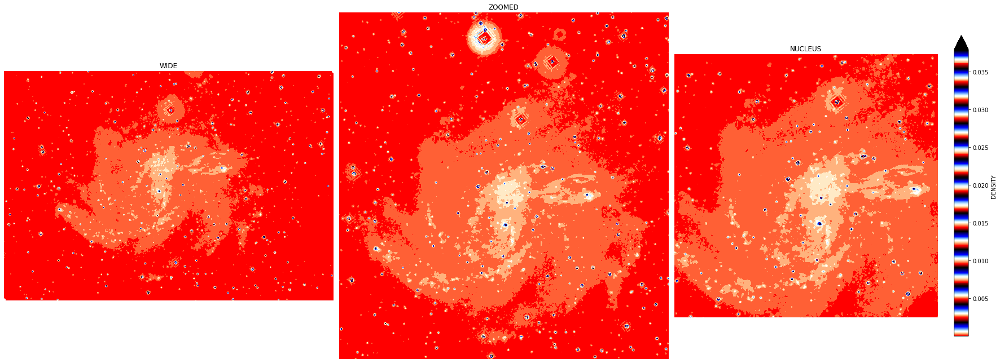

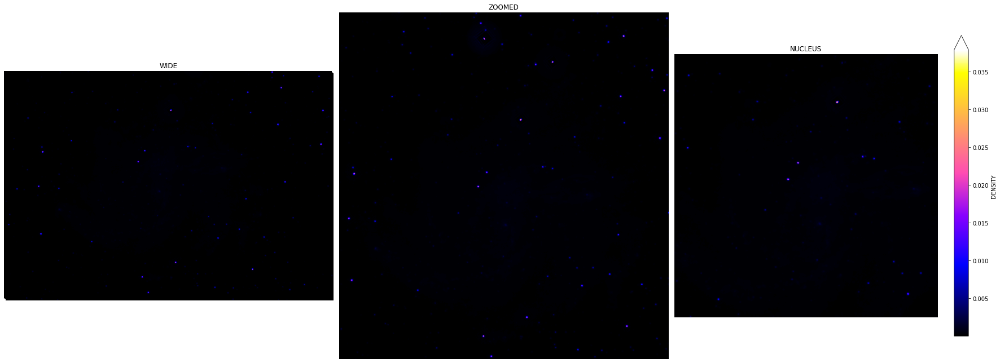

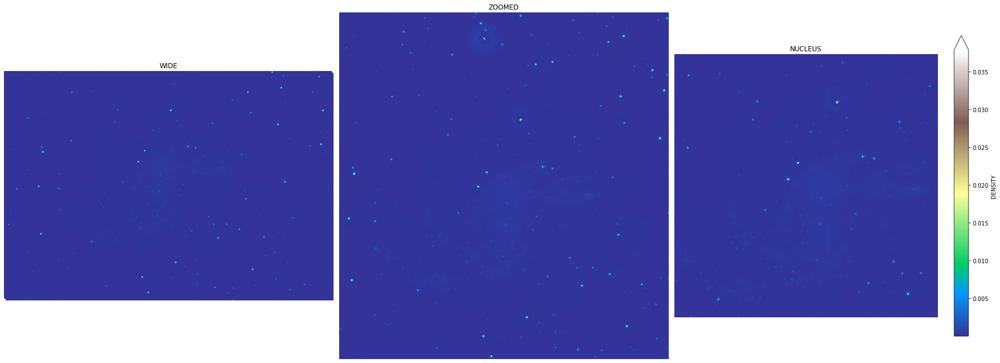

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,3,figsize=(25,25))

    axis[0].imshow(WIDE_SCALE_OM / 255.,cmap=x_spec)
    axis[0].set_title("WIDE")
    axis[0].axis("off")

    axis[1].imshow(ZOOMED_SCALE_OM / 255.,cmap=x_spec)
    axis[1].set_title("ZOOMED")
    axis[1].axis("off")

    DENSITY_FUNC = axis[2].imshow(NUCLEUS_SCALE_OM / 255.,cmap=x_spec)
    axis[2].set_title("NUCLEUS")
    axis[2].axis("off")

    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",extend="max")
    plt.tight_layout()
    plt.show()

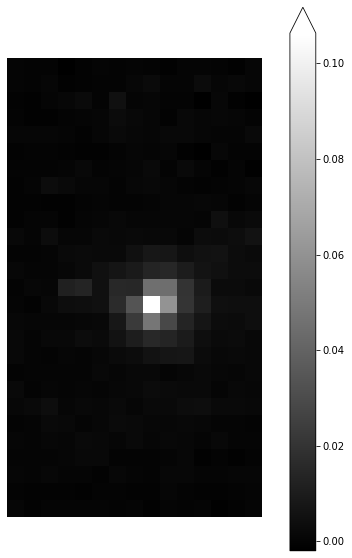

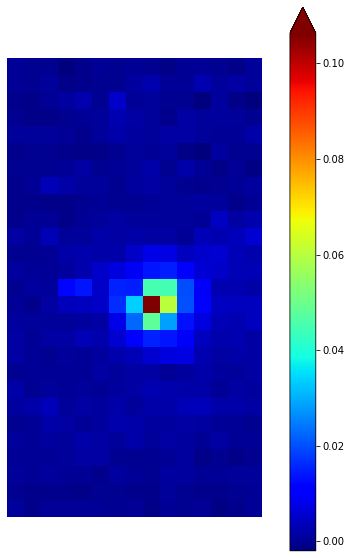

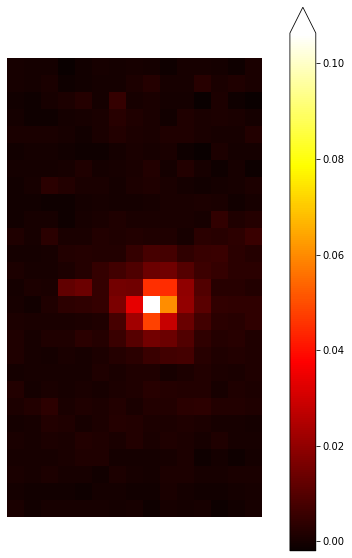

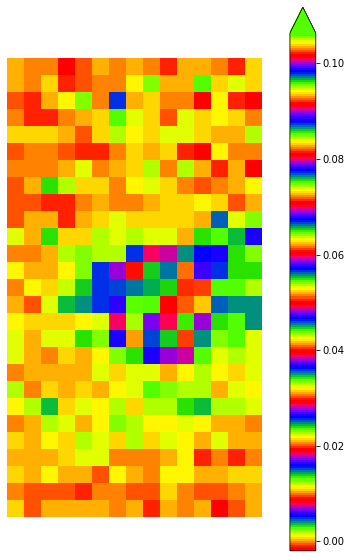

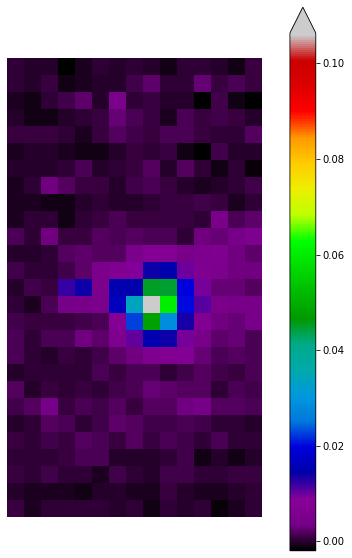

...

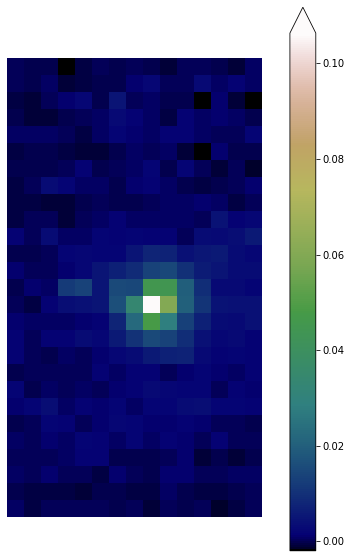

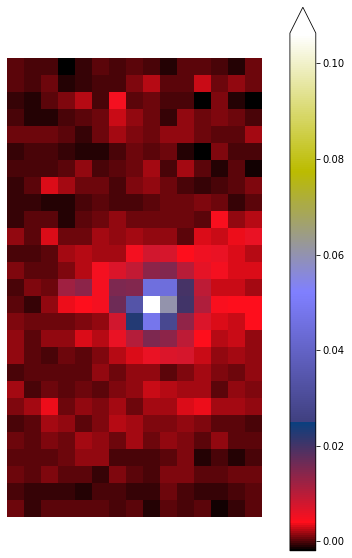

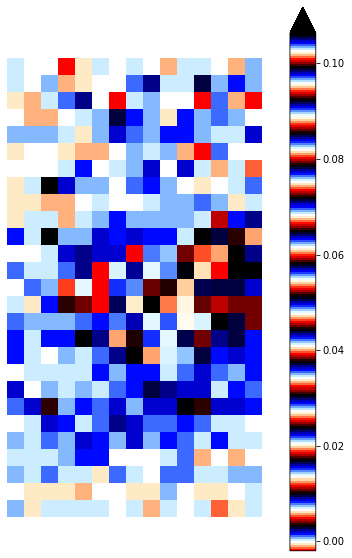

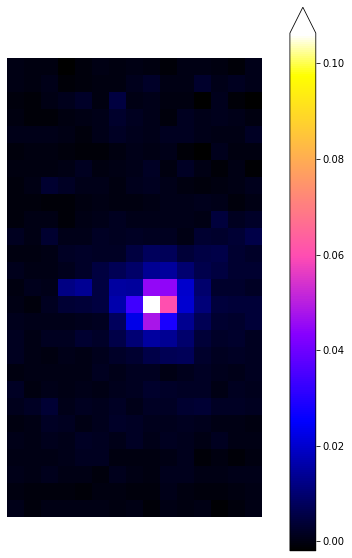

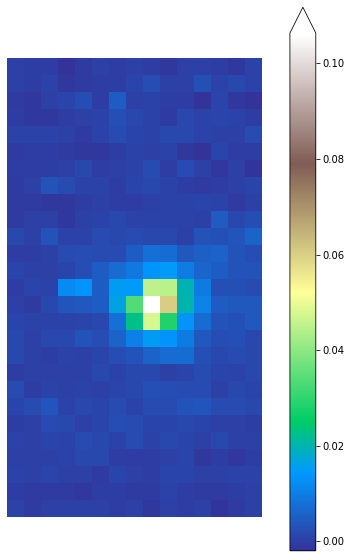

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure = plt.figure(figsize=(10,10))
    plt.axis("off")
    plt.imshow(ISO_CONS_SCALE,cmap=x_spec)
    plt.colorbar(extend="max")
    plt.show()

# **Let's look back and note the formats and data which give better interpretation than others**